<a href="https://colab.research.google.com/github/RaihanWinurputra/LoanDefaultPrediction/blob/main/Project_Loan_Default_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Environment Preparation**

## Instalation and Import Library

In [ ]:
# Instalation Pandas-Profiling
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.5/393.5 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 79.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=f4749348294abf5c0d091bfc8be9dc06871a0eb44d8902e063adb03af8f9a871
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [ ]:
# Instalation Kaleido
!pip install -U kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 12.2 MB/s eta 0:00:00


In [ ]:
# Data Manipulation and Numerical Operation Library
import pandas as pd
import numpy as np

# Google Drive Integration Library
from google.colab import drive

# Data Visualization Library
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

# EDA Library
from ydata_profiling import ProfileReport

# Machine Learning and Algorithm Library
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_sample_weight

# Utility Library
import joblib
import os

# Notebook Settings
pd.set_option('display.max_columns', None)

## Google Drive Integration

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


## General Function

In [ ]:
def toExcel(df, filename):
    if not filename.endswith('.xlsx'):
        filename += '.xlsx'

    filePath = f"/content/drive/MyDrive/Kaggle Project/Loan Default Prediction/Output/{filename}"

    df.to_excel(filePath, index=True)

    print(f"File saved in: {filePath}")
    return filePath

In [ ]:
def saveImage(fig, filename):
  path = f"/content/drive/MyDrive/Kaggle Project/Loan Default Prediction/Output/{filename}.jpeg"
  fig.write_image(path)

# **Data Understanding**

## Load Dataset

In [ ]:
# Load Data Train
dfTrainPath = '/content/drive/MyDrive/Kaggle Project/Loan Default Prediction/Dataset/train.csv'
dfTrain = pd.read_csv(dfTrainPath)

# Load Data Test
dfTestPath = '/content/drive/MyDrive/Kaggle Project/Loan Default Prediction/Dataset/test.csv'
dfTest = pd.read_csv(dfTestPath)

In [ ]:
dfTrain

,Id,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,0
7496,7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,1
7497,7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,0
7498,7498,Home Mortgage,NaN,NaN,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,0


In [ ]:
dfTest

,Id,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score
0,7500,Rent,NaN,4 years,0.0,9.0,12.5,220968.0,0.0,70.0,0.0,debt consolidation,Short Term,162470.0,105906.0,6813.0,NaN
1,7501,Rent,231838.0,1 year,0.0,6.0,32.7,55946.0,0.0,8.0,0.0,educational expenses,Short Term,78298.0,46037.0,2318.0,699.0
2,7502,Home Mortgage,1152540.0,3 years,0.0,10.0,13.7,204600.0,0.0,NaN,0.0,debt consolidation,Short Term,200178.0,146490.0,18729.0,7260.0
3,7503,Home Mortgage,1220313.0,10+ years,0.0,16.0,17.0,456302.0,0.0,70.0,0.0,debt consolidation,Short Term,217382.0,213199.0,27559.0,739.0
4,7504,Home Mortgage,2340952.0,6 years,0.0,11.0,23.6,1207272.0,0.0,NaN,0.0,debt consolidation,Long Term,777634.0,425391.0,42605.0,706.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,9995,Home Mortgage,1020053.0,10+ years,0.0,14.0,29.1,559152.0,1.0,68.0,1.0,debt consolidation,Short Term,99999999.0,162735.0,15046.0,745.0
2496,9996,Home Mortgage,NaN,2 years,0.0,15.0,17.0,1737780.0,0.0,77.0,0.0,debt consolidation,Short Term,468512.0,1439269.0,32996.0,NaN
2497,9997,Home Mortgage,1171806.0,2 years,0.0,48.0,12.8,1706430.0,0.0,NaN,0.0,debt consolidation,Short Term,430496.0,676438.0,36912.0,695.0
2498,9998,Rent,723520.0,10+ years,0.0,14.0,28.8,945780.0,0.0,NaN,0.0,debt consolidation,Short Term,257774.0,391248.0,13506.0,744.0


## Profiling Report

This dataset contains information about loan applicants, including their financial status, credit history, and loan details. Below is a brief explanation of each feature:



*   **Id**: A unique identifier for each applicant.
*   **Home Ownership**: The type of home ownership status (e.g., Rent, Mortgage, Own).
*   **Annual Income**: The applicant's yearly income.
*   **Years in current job**: The number of years the applicant has been in their current job.
*   **Tax Liens**: The number of tax liens on the applicant.
*   **Number of Open Accounts**: The total number of open credit accounts.
*   **Years of Credit History**: The length of the applicant's credit history in years.
*   **Maximum Open Credit**: The highest credit limit among all accounts.
*   **Number of Credit Problems**: The number of past credit issues (e.g., late payments).
*   **Months since last delinquent**: The number of months since the last delinquent payment.
*   **Bankruptcies**: The number of past bankruptcies filed by the applicant.
*   **Purpose**: The purpose of the loan (e.g., debt consolidation, home improvement).
*   **Term**: The duration of the loan term (e.g., 36 months, 60 months).
*   **Current Loan Amount**: The amount of the current loan taken by the applicant.
*   **Current Credit Balance**: The total outstanding balance across all credit accounts.
*   **Monthly Debt**: The applicant's monthly debt obligations.
*   **Credit Score**: The applicant’s credit score.
*   **Credit Default**: The target variable indicating whether the applicant defaulted on the loan (1 = Default, 0 = No Default).

## Profiling Report

In [ ]:
profile = ProfileReport(dfTrain, title="Profiling Report for dfTrain", explorative=True)
profile.to_notebook_iframe()
profile.to_file("Profiling Report - dfTrain.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

can be accessed at [Profiling Report - dfTrain.html](https://github.com/RaihanWinurputra/LoanDefaultPrediction/blob/main/Profiling%20Report%20-%20dfTrain.html)



Based on the dataset profiling and initial exploratory analysis, we identified several features with potential issues, including missing values, skewed distributions, outliers, and imbalanced data. Below are the key findings:

1. **Missing Values**
*   **Annual Income** → Contains missing values, which may require imputation using median or predictive modeling.
*   **Years in Current Job** → Has missing values, potentially affecting credit history insights.
*   **Months Since Last Delinquent** → Many missing values, likely because many customers have no delinquency history.
*   **Bankruptcies** → Contains missing values and is highly imbalanced (most customers have no bankruptcies).
*   **Credit Score** → Missing values, and potential formatting inconsistencies (e.g., values in different scales).

*Handling: We may use median imputation or predictive modeling.*









2. **Skewed Distributions & Outliers**
*   **Annual Income** → Right-skewed, indicating a few individuals with extremely high income values.
*   **Current Loan Amount** → Skewed distribution with possible outliers; transformation (e.g., log transformation) may be needed.
*   **Current Credit Balance** → Shows right-skewed distribution, meaning most people have lower balances, with a few having extremely high credit.
*   **Monthly Debt** → Heavily skewed with high variance, potentially affecting model stability.
*   **Maximum Open Credit** → Contains extreme outliers, which may need capping or winsorization.

*Handling: We will explore transformations such as log scaling to reduce skewness and normalize distributions.*

3. **Imbalanced Features**
*   **Bankruptcies** → Majority of customers have never declared bankruptcy, leading to an imbalanced distribution.
*   **Purpose** → Some loan purposes dominate the dataset, potentially affecting model performance.
*   **Credit Default** (Target Variable) → The dataset is imbalanced, meaning there are significantly more non-defaulters than defaulters, which can impact model learning.

*Handling: We may use oversampling, undersampling, or class-weighted approaches to address the imbalance in target distribution.*


## Checking Outlier

In [ ]:
numFeature = ["Annual Income", "Tax Liens", "Number of Open Accounts",
              "Years of Credit History", "Maximum Open Credit", "Number of Credit Problems",
              "Months since last delinquent", "Current Loan Amount", "Current Credit Balance",
              "Monthly Debt", "Credit Score"]

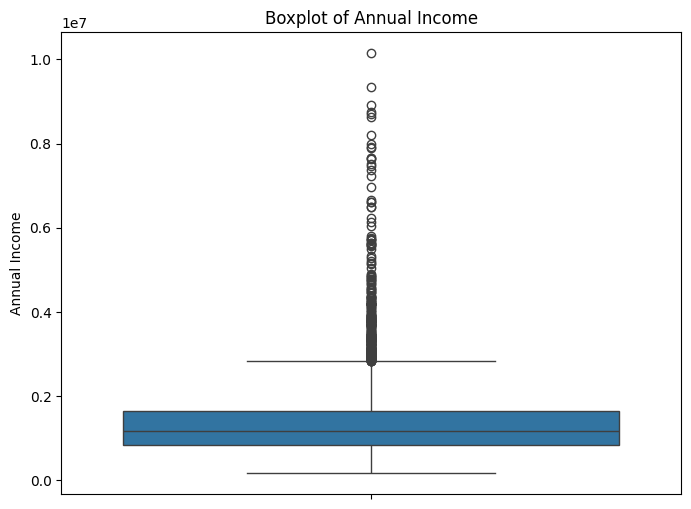

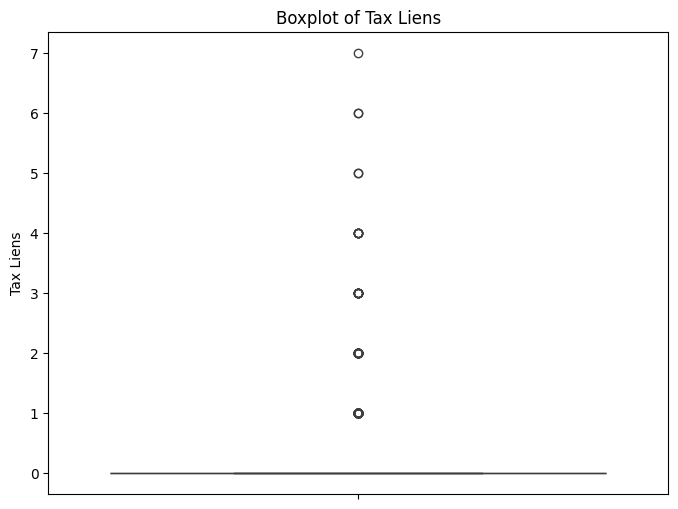

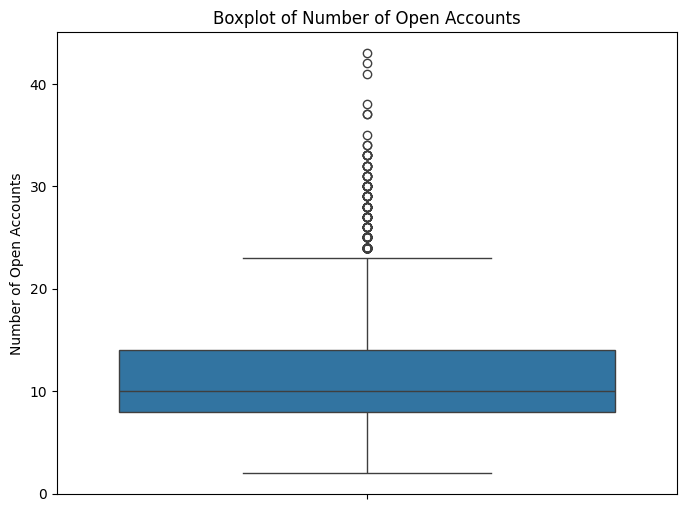

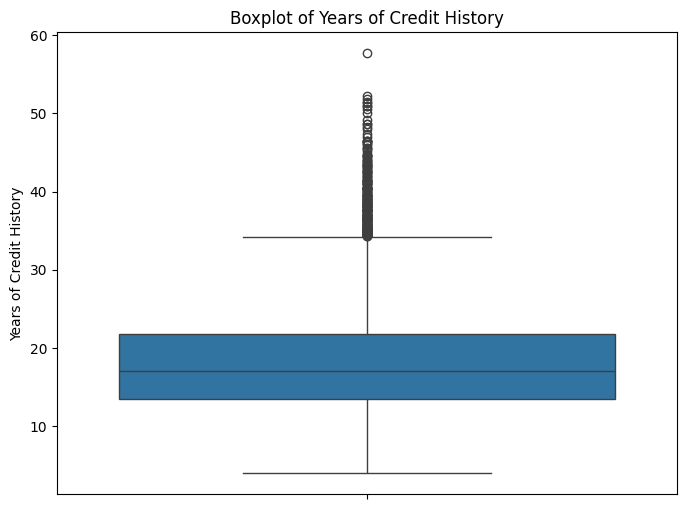

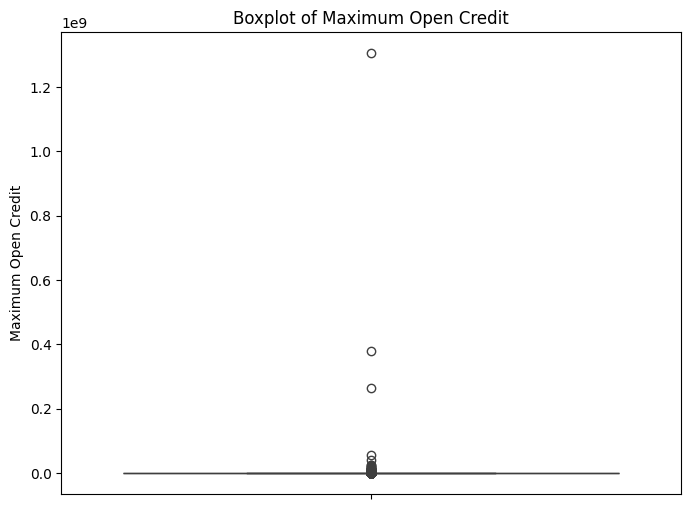

...

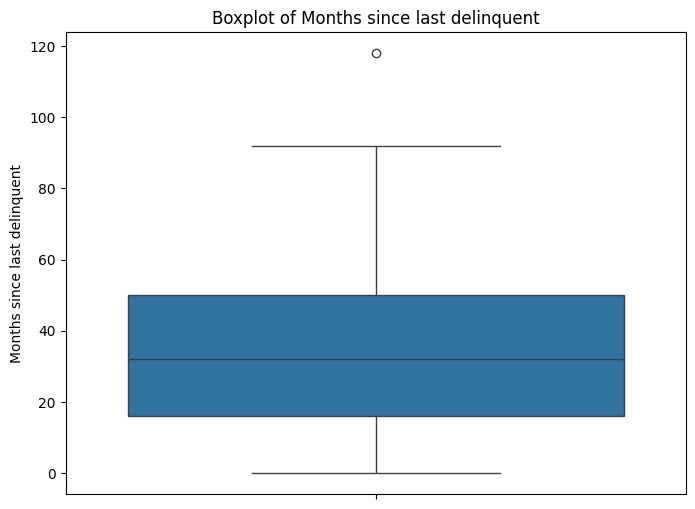

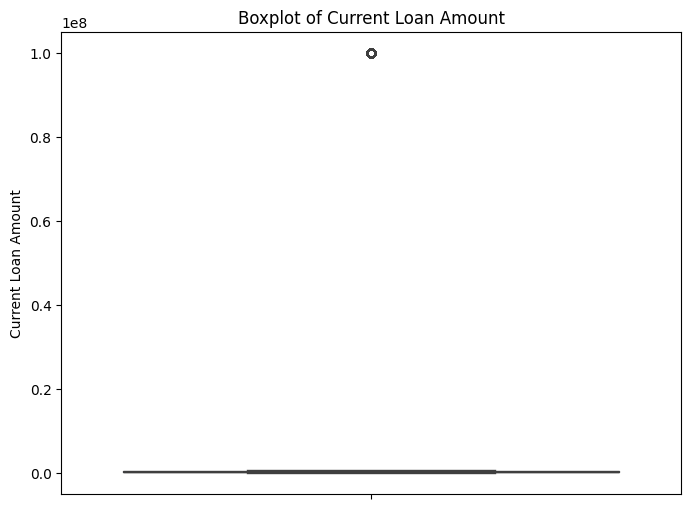

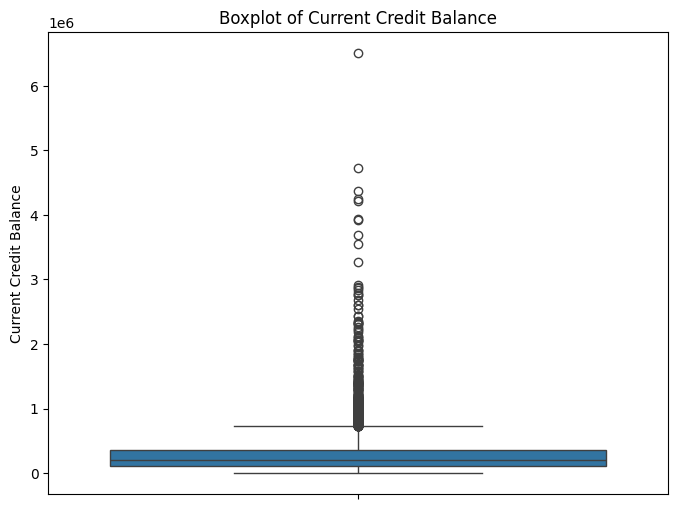

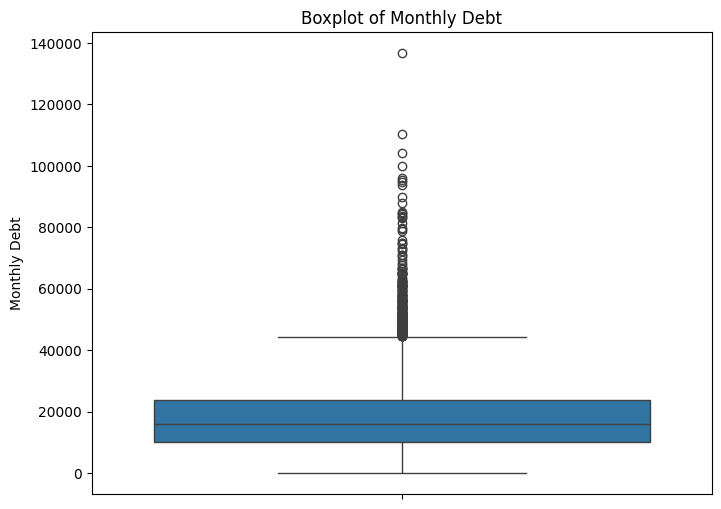

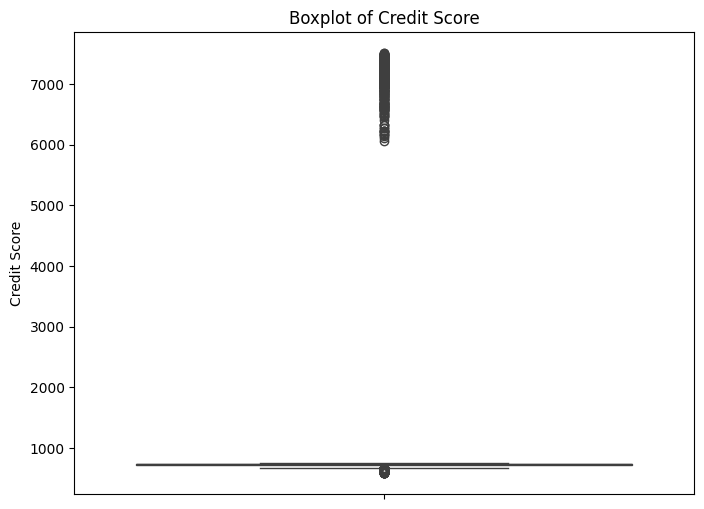

In [ ]:
for col in numFeature:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=dfTrain[col])
    plt.title(f"Boxplot of {col}")
    plt.ylabel(col)
    plt.show()

Outliers were identified using boxplots, revealing feature with extreme values:
*   **Annual Income & Monthly Deb**t → Many values exceed the upper fence, indicating skewed distributions.
*   **Current Credit Balance** → Numerous outliers, with some extreme values far from the upper fence.
*   **Credit Score** → Extreme values due to incorrect formatting (e.g., 7500 instead of 750).
*   **Current Loan Amount** → Several values at 99,999,999, likely representing missing loans or a placeholder.
*   **Years of Credit History** → Some high values but not excessively extreme.
*   Other Features → Minor outliers present but less critical.


# **Data Preparation**

In [ ]:
dfPrep = dfTrain.copy().drop(columns=['Id'])

In [ ]:
dfPrep

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,< 1 year,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,0
7496,Home Mortgage,1533984.0,1 year,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,1
7497,Rent,1878910.0,6 years,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,0
7498,Home Mortgage,NaN,NaN,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,0


## Fixing Value Format

Before proceeding with modeling, some feature values need format adjustments to ensure consistency and accuracy:
*   **Years in Current Job** → Removed the word *"years"* from values, keeping only the numeric part. This simplifies the data and ensures compatibility with models.
*   **Credit Score** → Some values contain an extra zero (*e.g., 7920 instead of 792*). Since credit scores range between *300–850*, values above *1000* were divided by *10* to correct the format.




### Years in Current Job

In [ ]:
def cleanYearsJob(df):
    df["Years in current job"] = df["Years in current job"].replace({
        "10+ years": "10",
        "< 1 year": "1"
    }).str.extract("(\d+)")[0]

    return df

In [ ]:
dfPrep = cleanYearsJob(dfPrep)
dfPrep

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0
1,Own Home,1025487.0,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1
2,Home Mortgage,751412.0,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0
3,Own Home,805068.0,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0
4,Rent,776264.0,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,0
7496,Home Mortgage,1533984.0,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,1
7497,Rent,1878910.0,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,0
7498,Home Mortgage,NaN,NaN,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,0


### Credit Score

In [ ]:
def fixCS(value):
    if value > 1000:
        new_value = value / 10
        if 300 <= new_value <= 850:
            return new_value
    return value

In [ ]:
dfPrep['Credit Score - Fixed'] = dfPrep['Credit Score'].apply(fixCS)

moveCol = dfPrep.pop('Credit Score - Fixed')
dfPrep.insert(dfPrep.columns.get_loc('Credit Score') + 1, 'Credit Score - Fixed', moveCol)
dfPrep

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Score - Fixed,Credit Default
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,749.0,0
1,Own Home,1025487.0,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,737.0,1
2,Home Mortgage,751412.0,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,742.0,0
3,Own Home,805068.0,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,694.0,0
4,Rent,776264.0,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,697.0,0
7496,Home Mortgage,1533984.0,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,741.0,1
7497,Rent,1878910.0,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,748.0,0
7498,Home Mortgage,NaN,NaN,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,NaN,0


## Handling Missing Value

To ensure data completeness, missing values were handled using different strategies based on feature characteristics and relationships with other variables.
*   **Annual Income → ML Imputation (Linear Regression)**
Strong correlation with Monthly Debt, Current Loan Amount, etc., making it suitable for regression-based imputation.
*   **Years in Current Job → Random Sampling**
Missing values filled using np.random.choice to maintain distribution.
*   **Months Since Last Delinquent → Median Imputation**
Median used due to skewed distribution.
*  **Bankruptcies → Fill with 0.0**
Assumed missing values mean no bankruptcy history.
*   **Credit Score → ML Imputation (Linear Regression)**
Imputed using Credit Default due to strong correlation.




### Annual Income

In [ ]:
dfPrep_1a = dfPrep.copy()

In [ ]:
regFeatures = ['Monthly Debt', 'Current Loan Amount', 'Current Credit Balance', 'Maximum Open Credit']

xTrain = dfPrep_1a.dropna(subset=['Annual Income'])[regFeatures]
yTrain = dfPrep_1a.dropna(subset=['Annual Income'])['Annual Income']

xMissing = dfPrep_1a[dfPrep_1a['Annual Income'].isna()][regFeatures]

regModel = LinearRegression()
regModel.fit(xTrain, yTrain)

dfPrep_1a.loc[dfPrep_1a['Annual Income'].isna(), 'Annual Income - Reg'] = regModel.predict(xMissing)
dfPrep_1a['Annual Income - Reg'].fillna(dfPrep_1a['Annual Income'], inplace=True)
dfPrep_1a['Annual Income - Reg'] = dfPrep_1a['Annual Income - Reg'].astype(int)

moveCol = dfPrep_1a.pop('Annual Income - Reg')
dfPrep_1a.insert(dfPrep_1a.columns.get_loc('Annual Income') + 1, 'Annual Income - Reg', moveCol)
dfPrep_1a

<ipython-input-21-119447e61a01>:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





,Home Ownership,Annual Income,Annual Income - Reg,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Score - Fixed,Credit Default
0,Own Home,482087.0,482087,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,749.0,0
1,Own Home,1025487.0,1025487,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,737.0,1
2,Home Mortgage,751412.0,751412,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,742.0,0
3,Own Home,805068.0,805068,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,694.0,0
4,Rent,776264.0,776264,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,402192,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,697.0,0
7496,Home Mortgage,1533984.0,1533984,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,741.0,1
7497,Rent,1878910.0,1878910,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,748.0,0
7498,Home Mortgage,NaN,2116131,NaN,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,NaN,0


### Years in Current Job

In [ ]:
dfPrep_1b = dfPrep_1a.copy()

In [ ]:
dfPrep_1b['Years in current job - Random'] = dfPrep_1b['Years in current job'].copy()

dfPrep_1b['Years in current job - Random'] = dfPrep_1b['Years in current job - Random'].apply(
    lambda x: np.random.choice(dfPrep_1b['Years in current job'].dropna().values) if pd.isna(x) else x
)

dfPrep_1b['Years in current job - Random'] = dfPrep_1b['Years in current job - Random'].astype(int)

moveCol = dfPrep_1b.pop('Years in current job - Random')
dfPrep_1b.insert(dfPrep_1b.columns.get_loc('Years in current job') + 1, 'Years in current job - Random', moveCol)
dfPrep_1b

,Home Ownership,Annual Income,Annual Income - Reg,Years in current job,Years in current job - Random,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Score - Fixed,Credit Default
0,Own Home,482087.0,482087,NaN,10,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,749.0,0
1,Own Home,1025487.0,1025487,10,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,737.0,1
2,Home Mortgage,751412.0,751412,8,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,742.0,0
3,Own Home,805068.0,805068,6,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,694.0,0
4,Rent,776264.0,776264,8,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,402192,1,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,other,Short Term,129360.0,73492.0,1900.0,697.0,697.0,0
7496,Home Mortgage,1533984.0,1533984,1,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,741.0,1
7497,Rent,1878910.0,1878910,6,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,748.0,0
7498,Home Mortgage,NaN,2116131,NaN,1,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,NaN,0


### Month Since Last Delinquent

In [ ]:
dfPrep_1c = dfPrep_1b.copy()

In [ ]:
medianDM = dfPrep_1c['Months since last delinquent'].median()
dfPrep_1c['Months since last delinquent - Median'] = dfPrep_1c['Months since last delinquent'].fillna(medianDM)

moveCol = dfPrep_1c.pop('Months since last delinquent - Median')
dfPrep_1c.insert(dfPrep_1c.columns.get_loc('Months since last delinquent') + 2, 'Months since last delinquent - Median', moveCol)
dfPrep_1c

,Home Ownership,Annual Income,Annual Income - Reg,Years in current job,Years in current job - Random,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Months since last delinquent - Median,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Score - Fixed,Credit Default
0,Own Home,482087.0,482087,NaN,10,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,749.0,0
1,Own Home,1025487.0,1025487,10,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,737.0,1
2,Home Mortgage,751412.0,751412,8,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,742.0,0
3,Own Home,805068.0,805068,6,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,694.0,0
4,Rent,776264.0,776264,8,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,402192,1,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,32.0,other,Short Term,129360.0,73492.0,1900.0,697.0,697.0,0
7496,Home Mortgage,1533984.0,1533984,1,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,43.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,741.0,1
7497,Rent,1878910.0,1878910,6,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,32.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,748.0,0
7498,Home Mortgage,NaN,2116131,NaN,1,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,32.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,NaN,0


### Bankruptcies

In [ ]:
dfPrep_1d = dfPrep_1c.copy()

In [ ]:
dfPrep_1d['Bankruptcies - Imputed'] = dfPrep_1d['Bankruptcies'].fillna(0.0)

moveCol = dfPrep_1d.pop('Bankruptcies - Imputed')
dfPrep_1d.insert(dfPrep_1d.columns.get_loc('Bankruptcies') + 1, 'Bankruptcies - Imputed', moveCol)
dfPrep_1d

,Home Ownership,Annual Income,Annual Income - Reg,Years in current job,Years in current job - Random,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Bankruptcies - Imputed,Months since last delinquent - Median,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Score - Fixed,Credit Default
0,Own Home,482087.0,482087,NaN,10,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,749.0,0
1,Own Home,1025487.0,1025487,10,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,737.0,1
2,Home Mortgage,751412.0,751412,8,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,742.0,0
3,Own Home,805068.0,805068,6,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,694.0,0
4,Rent,776264.0,776264,8,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,719.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,402192,1,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,0.0,32.0,other,Short Term,129360.0,73492.0,1900.0,697.0,697.0,0
7496,Home Mortgage,1533984.0,1533984,1,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,0.0,43.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,741.0,1
7497,Rent,1878910.0,1878910,6,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,0.0,32.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,748.0,0
7498,Home Mortgage,NaN,2116131,NaN,1,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,0.0,32.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,NaN,0


### Credit Score

In [ ]:
dfPrep_1e = dfPrep_1d.copy()

In [ ]:
regFeatures = ['Credit Default']

xTrain = dfPrep_1e.dropna(subset=['Credit Score - Fixed'])[regFeatures]
yTrain = dfPrep_1e.dropna(subset=['Credit Score - Fixed'])['Credit Score - Fixed']

xMissing = dfPrep_1e[dfPrep_1e['Credit Score - Fixed'].isna()][regFeatures]

regModel = LinearRegression()
regModel.fit(xTrain, yTrain)

dfPrep_1e.loc[dfPrep_1e['Credit Score - Fixed'].isna(), 'Credit Score - Reg'] = regModel.predict(xMissing)
dfPrep_1e['Credit Score - Reg'].fillna(dfPrep_1e['Credit Score - Fixed'], inplace=True)
dfPrep_1e['Credit Score - Reg'] = dfPrep_1e['Credit Score - Reg'].astype(int)

moveCol = dfPrep_1e.pop('Credit Score - Reg')
dfPrep_1e.insert(dfPrep_1e.columns.get_loc('Credit Score - Fixed') + 1, 'Credit Score - Reg', moveCol)
dfPrep_1e

<ipython-input-29-09b375ea9de6>:12: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





,Home Ownership,Annual Income,Annual Income - Reg,Years in current job,Years in current job - Random,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Bankruptcies - Imputed,Months since last delinquent - Median,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Score - Fixed,Credit Score - Reg,Credit Default
0,Own Home,482087.0,482087,NaN,10,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,749.0,749,0
1,Own Home,1025487.0,1025487,10,10,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,737.0,737,1
2,Home Mortgage,751412.0,751412,8,8,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,742.0,742,0
3,Own Home,805068.0,805068,6,6,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,694.0,694,0
4,Rent,776264.0,776264,8,8,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,719.0,719,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192.0,402192,1,1,0.0,3.0,8.5,107866.0,0.0,NaN,0.0,0.0,32.0,other,Short Term,129360.0,73492.0,1900.0,697.0,697.0,697,0
7496,Home Mortgage,1533984.0,1533984,1,1,0.0,10.0,26.5,686312.0,0.0,43.0,0.0,0.0,43.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,7410.0,741.0,741,1
7497,Rent,1878910.0,1878910,6,6,0.0,12.0,32.1,1778920.0,0.0,NaN,0.0,0.0,32.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748.0,748.0,748,0
7498,Home Mortgage,NaN,2116131,NaN,1,0.0,21.0,26.5,1141250.0,0.0,NaN,0.0,0.0,32.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,NaN,NaN,723,0


## Adjusting Column

In [ ]:
dfPrep_1f = dfPrep_1e.copy()

### Deleting Unwanted Column

In [ ]:
delColumn = ['Annual Income', 'Years in current job', 'Months since last delinquent', 'Bankruptcies', 'Credit Score', 'Credit Score - Fixed']
dfPrep_1f = dfPrep_1f.drop(columns=delColumn)

dfPrep_1f.head()

,Home Ownership,Annual Income - Reg,Years in current job - Random,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies - Imputed,Months since last delinquent - Median,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score - Reg,Credit Default
0,Own Home,482087,10,0.0,11.0,26.3,685960.0,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749,0
1,Own Home,1025487,10,0.0,15.0,15.3,1181730.0,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737,1
2,Home Mortgage,751412,8,0.0,11.0,35.0,1182434.0,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742,0
3,Own Home,805068,6,0.0,8.0,22.5,147400.0,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694,0
4,Rent,776264,8,0.0,13.0,13.6,385836.0,1.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719,0


### Renaming Column

In [ ]:
dfPrep_1f = dfPrep_1f.rename(columns={
    "Annual Income - Reg": "Annual Income",
    "Years in current job - Random": "Years in current job",
    "Bankruptcies - Imputed": "Bankruptcies",
    'Months since last delinquent - Median': "Months since last delinquent",
    "Credit Score - Reg": "Credit Score"
})

dfPrep_1f.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Months since last delinquent,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
0,Own Home,482087,10,0.0,11.0,26.3,685960.0,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749,0
1,Own Home,1025487,10,0.0,15.0,15.3,1181730.0,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737,1
2,Home Mortgage,751412,8,0.0,11.0,35.0,1182434.0,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742,0
3,Own Home,805068,6,0.0,8.0,22.5,147400.0,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694,0
4,Rent,776264,8,0.0,13.0,13.6,385836.0,1.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719,0


## Feature Engineering: Creating New Feature

To enhance the predictive power of the model, additional features are created based on existing variables. These new features help capture important financial ratios and categorize numerical values into meaningful groups. The feature engineering process consists of two main parts:
*   **Ratio-Based Feature**
*   **Categorization Feature**



In [ ]:
dfPrep_2 = dfPrep_1f.copy()

### Ratio-Based Features

Derived metrics that provide deeper insights into financial stability and credit behavior.
*   **Debt to Income Ratio (DTI)** → Measures debt burden relative to income.
*   **Credit Utilization Ratio (CUR)** → Assesses how much available credit is used.
*   **Loan to Income Ratio (LTI)** → Evaluates loan burden compared to income.
*   **Credit Problem Ratio (CPR)** → Indicates credit issues per open account.
*   **Credit History Length per Account (CHLPA)** → Measures average credit history per account.



In [ ]:
dfPrep_2a = dfPrep_2.copy()

In [ ]:
def createRatioFeature(df):
    df = df.copy()

    # Debt to Income Ratio (DTI)
    df["Debt to Income Ratio"] = df["Monthly Debt"] / (df["Annual Income"] / 12)
    df["Debt to Income Ratio"] = df["Debt to Income Ratio"].replace([np.inf, -np.inf], np.nan)

    # Credit Utilization Ratio (CUR)
    df["Credit Utilization Ratio"] = df["Current Credit Balance"] / df["Maximum Open Credit"]
    df["Credit Utilization Ratio"] = df["Credit Utilization Ratio"].replace([np.inf, -np.inf], np.nan).fillna(0)

    # Loan to Income Ratio (LTI)
    df["Loan to Income Ratio"] = df["Current Loan Amount"] / df["Annual Income"]
    df["Loan to Income Ratio"] = df["Loan to Income Ratio"].replace([np.inf, -np.inf], np.nan)

    # Credit Problem Ratio (CPR)
    df["Credit Problem Ratio"] = df["Number of Credit Problems"] / df["Number of Open Accounts"]
    df["Credit Problem Ratio"] = df["Credit Problem Ratio"].replace([np.inf, -np.inf], np.nan)

    # Credit History Length per Account (CHLPA)
    df["Credit History Length per Account"] = df["Years of Credit History"] / df["Number of Open Accounts"]
    df["Credit History Length per Account"] = df["Credit History Length per Account"].replace([np.inf, -np.inf], np.nan)

    return df

In [ ]:
dfPrep_2a = createRatioFeature(dfPrep_2a)
dfPrep_2a

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Months since last delinquent,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Debt to Income Ratio,Credit Utilization Ratio,Loan to Income Ratio,Credit Problem Ratio,Credit History Length per Account
0,Own Home,482087,10,0.0,11.0,26.3,685960.0,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749,0,0.196993,0.069080,207.431437,0.090909,2.390909
1,Own Home,1025487,10,0.0,15.0,15.3,1181730.0,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737,1,0.214996,0.334232,0.258383,0.000000,1.020000
2,Home Mortgage,751412,8,0.0,11.0,35.0,1182434.0,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742,0,0.218006,0.260809,133.082781,0.000000,3.181818
3,Own Home,805068,6,0.0,8.0,22.5,147400.0,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694,0,0.168999,0.650305,0.150790,0.125000,2.812500
4,Rent,776264,8,0.0,13.0,13.6,385836.0,1.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719,0,0.110993,0.241836,0.162110,0.076923,1.046154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192,1,0.0,3.0,8.5,107866.0,0.0,0.0,32.0,other,Short Term,129360.0,73492.0,1900.0,697,0,0.056689,0.681327,0.321637,0.000000,2.833333
7496,Home Mortgage,1533984,1,0.0,10.0,26.5,686312.0,0.0,0.0,43.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,741,1,0.099998,0.665002,0.289474,0.000000,2.650000
7497,Rent,1878910,6,0.0,12.0,32.1,1778920.0,0.0,0.0,32.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748,0,0.079699,0.268597,53.222346,0.000000,2.675000
7498,Home Mortgage,2116131,1,0.0,21.0,26.5,1141250.0,0.0,0.0,32.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,723,0,0.210486,0.417143,0.290754,0.000000,1.261905


### Categorization Feature

Grouping numerical values into meaningful categories to improve model interpretability.
*  **Income Level** → Categorized into Low, Medium, High.
*   **Loan Amount Level** → Groups loans into Small, Medium, Large, Very Large, with No Loan for extreme values.
*   **Credit Balance Level** → Categorized into No Balance, Small, Medium, Large, Very Large.
*   **Monthly Debt Level** → Classified into No Debt, Low, Moderate, High, Very High.
*   **Credit Score Level** → Segments scores into Fair, Good, Very Good.
*   **Purpose Category** → Groups loan purposes into Productive, Moderate, Consumptive.






In [ ]:
dfPrep_2b = dfPrep_2a.copy()

In [ ]:
def createCategorizeFeature(df):
    df = df.copy()

    # Income Level
    df['Income Level'] = pd.cut(df['Annual Income'],
                                bins=[-float('inf'), 1500000, 3000000, float('inf')],
                                labels=['Low', 'Medium', 'High'])

    # Loan Amount Level
    df['Loan Amount Level'] = pd.cut(df['Current Loan Amount'],
                                 bins=[0, 100000, 300000, 600000, float('inf')],
                                 labels=['Small', 'Medium', 'Large', 'Very Large'])

    df['Loan Amount Level'] = df['Loan Amount Level'].astype(str)
    df.loc[df['Current Loan Amount'] == 99999999, 'Loan Amount Level'] = 'No Loan'

    # Credit Balance Level
    df['Credit Balance Level'] = pd.cut(df['Current Credit Balance'],
                                        bins=[-float('inf'), 0, 100000, 500000, 1000000, float('inf')],
                                        labels=['No Balance', 'Small', 'Medium', 'Large', 'Very Large'])

    # Monthly Debt Level
    df['Monthly Debt Level'] = pd.cut(df['Monthly Debt'],
                                      bins=[-float('inf'), 0, 10000, 20000, 40000, float('inf')],
                                      labels=['No Debt', 'Low', 'Moderate', 'High', 'Very High'])

    # Credit Score Level
    df['Credit Score Level'] = pd.cut(df['Credit Score'],
                                      bins=[579, 669, 739, 799],  # Hanya batas untuk Fair, Good, Very Good
                                      labels=['Fair', 'Good', 'Very Good'],
                                      include_lowest=True)


    # Purpose Category
    productive_purpose = ['buy a house', 'business loan', 'small business', 'renewable energy']
    consumptive_purpose = ['buy a car', 'moving', 'wedding', 'take a trip', 'vacation', 'major purchase', 'other']
    moderate_purpose = ['educational expenses', 'home improvements', 'medical bills', 'debt consolidation']

    df['Purpose Category'] = df['Purpose'].str.lower().map(lambda x: 'Productive' if x in productive_purpose else
                                                            'Consumptive' if x in consumptive_purpose else
                                                            'Moderate')

    return df

In [ ]:
dfPrep_2b=createCategorizeFeature(dfPrep_2b)
dfPrep_2b

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Months since last delinquent,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Debt to Income Ratio,Credit Utilization Ratio,Loan to Income Ratio,Credit Problem Ratio,Credit History Length per Account,Income Level,Loan Amount Level,Credit Balance Level,Monthly Debt Level,Credit Score Level,Purpose Category
0,Own Home,482087,10,0.0,11.0,26.3,685960.0,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749,0,0.196993,0.069080,207.431437,0.090909,2.390909,Low,No Loan,Small,Low,Very Good,Moderate
1,Own Home,1025487,10,0.0,15.0,15.3,1181730.0,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737,1,0.214996,0.334232,0.258383,0.000000,1.020000,Low,Medium,Medium,Moderate,Good,Moderate
2,Home Mortgage,751412,8,0.0,11.0,35.0,1182434.0,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742,0,0.218006,0.260809,133.082781,0.000000,3.181818,Low,No Loan,Medium,Moderate,Very Good,Moderate
3,Own Home,805068,6,0.0,8.0,22.5,147400.0,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694,0,0.168999,0.650305,0.150790,0.125000,2.812500,Low,Medium,Small,Moderate,Good,Moderate
4,Rent,776264,8,0.0,13.0,13.6,385836.0,1.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719,0,0.110993,0.241836,0.162110,0.076923,1.046154,Low,Medium,Small,Low,Good,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192,1,0.0,3.0,8.5,107866.0,0.0,0.0,32.0,other,Short Term,129360.0,73492.0,1900.0,697,0,0.056689,0.681327,0.321637,0.000000,2.833333,Low,Medium,Small,Low,Good,Consumptive
7496,Home Mortgage,1533984,1,0.0,10.0,26.5,686312.0,0.0,0.0,43.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,741,1,0.099998,0.665002,0.289474,0.000000,2.650000,Medium,Large,Medium,Moderate,Very Good,Moderate
7497,Rent,1878910,6,0.0,12.0,32.1,1778920.0,0.0,0.0,32.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748,0,0.079699,0.268597,53.222346,0.000000,2.675000,Medium,No Loan,Medium,Moderate,Very Good,Consumptive
7498,Home Mortgage,2116131,1,0.0,21.0,26.5,1141250.0,0.0,0.0,32.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,723,0,0.210486,0.417143,0.290754,0.000000,1.261905,Medium,Very Large,Medium,High,Good,Moderate


# **Exploratory Data Analysis (EDA)**

In [ ]:
dfEda = dfPrep_2b.copy()

In [ ]:
numFeature = [
    'Annual Income','Years in current job',
    'Tax Liens','Number of Open Accounts',
    'Years of Credit History','Maximum Open Credit',
    'Number of Credit Problems','Months since last delinquent',
    'Current Loan Amount','Current Credit Balance',
    'Monthly Debt','Credit Score',
    'Debt to Income Ratio','Credit Utilization Ratio',
    'Loan to Income Ratio','Credit Problem Ratio',
    'Credit History Length per Account'
]

catFeature = [
    'Home Ownership','Bankruptcies',
    'Purpose','Term',
    'Income Level', 'Purpose Category',
    'Loan Amount Level','Credit Balance Level',
    'Monthly Debt Level','Credit Score Level',
]

## Numerical Feature

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



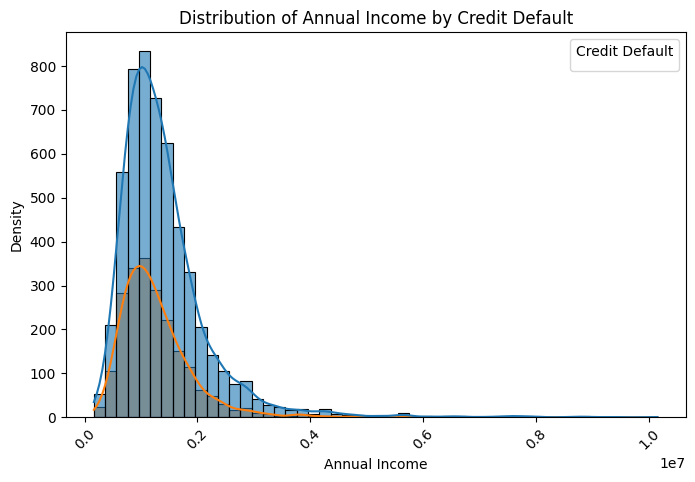

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



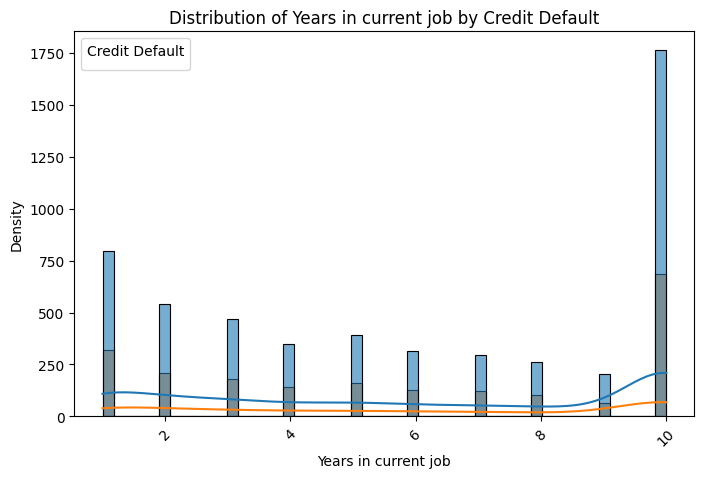

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



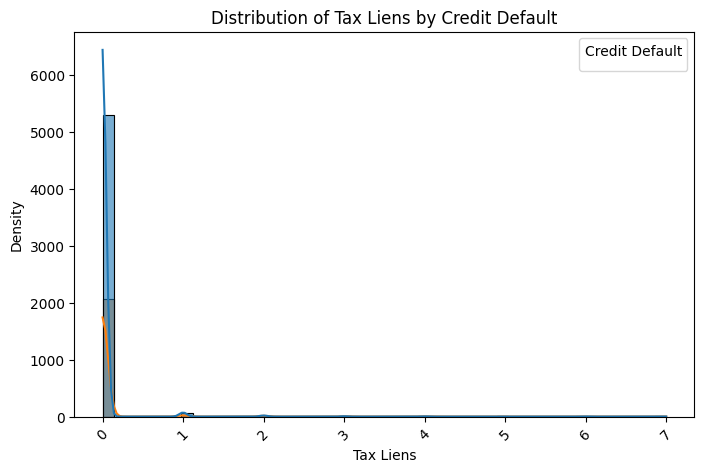

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



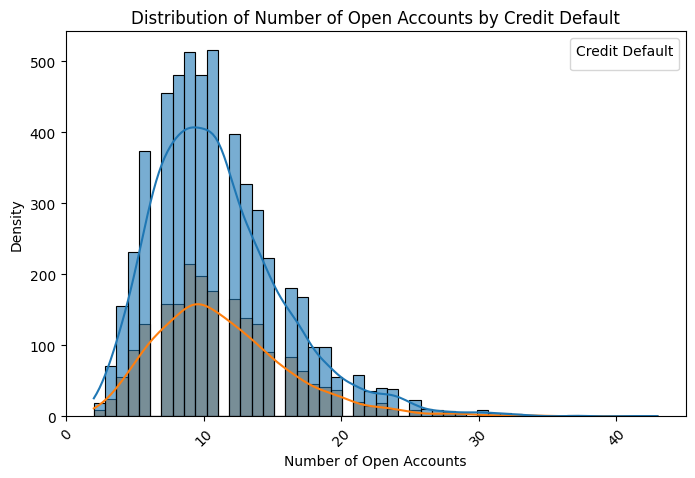

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



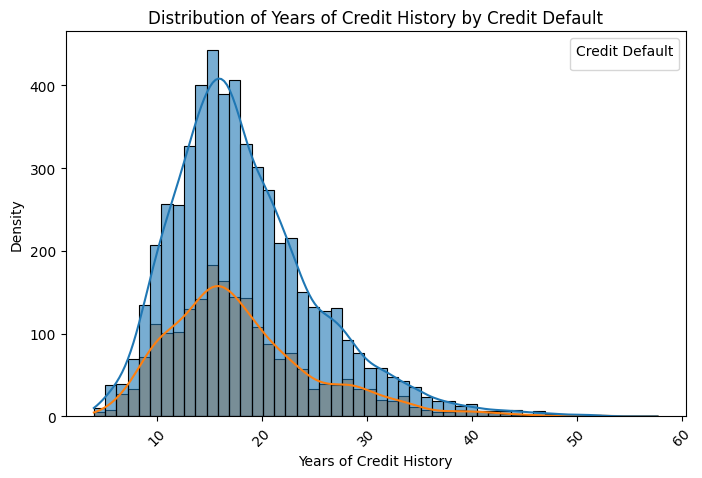

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



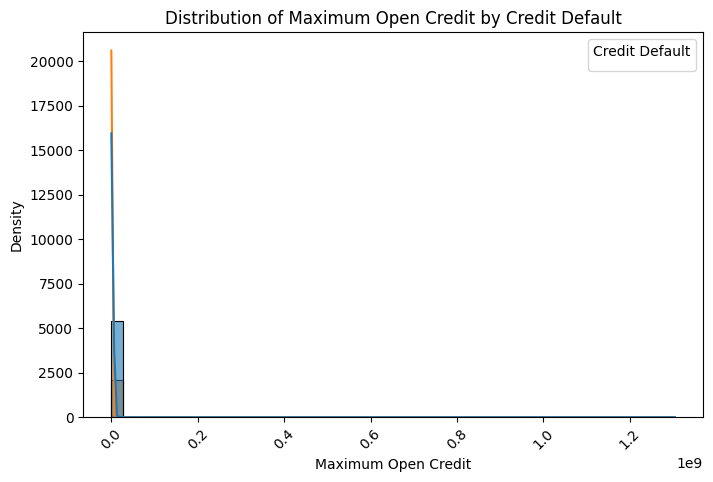

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



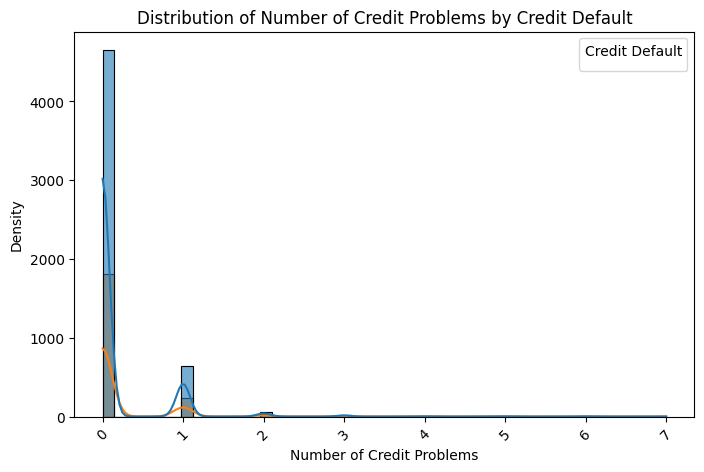

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



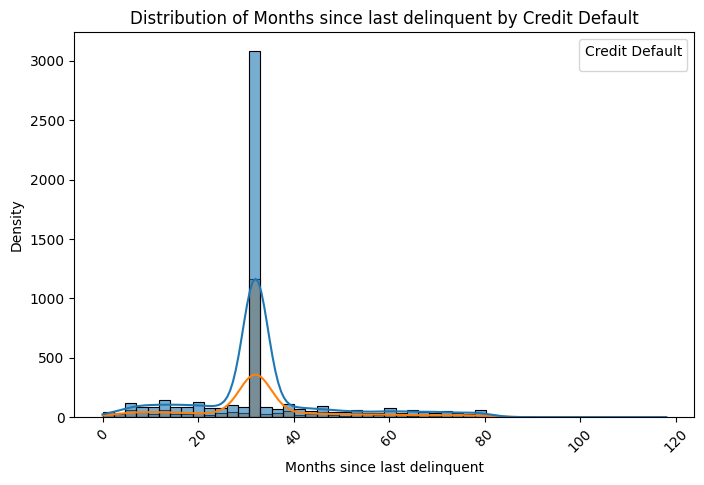

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



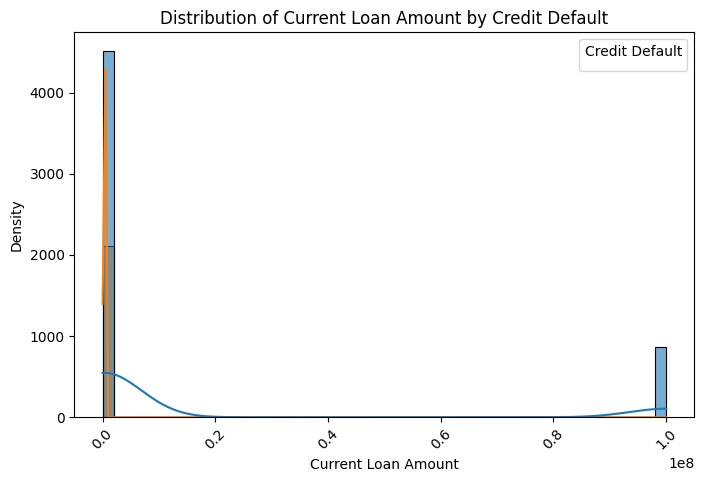

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



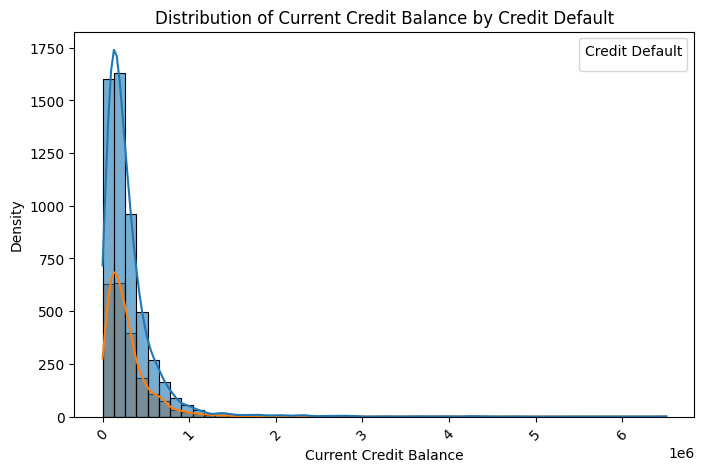

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



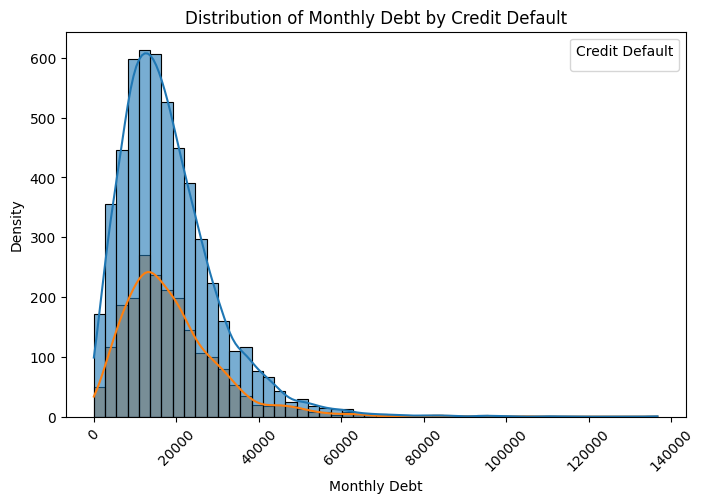

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



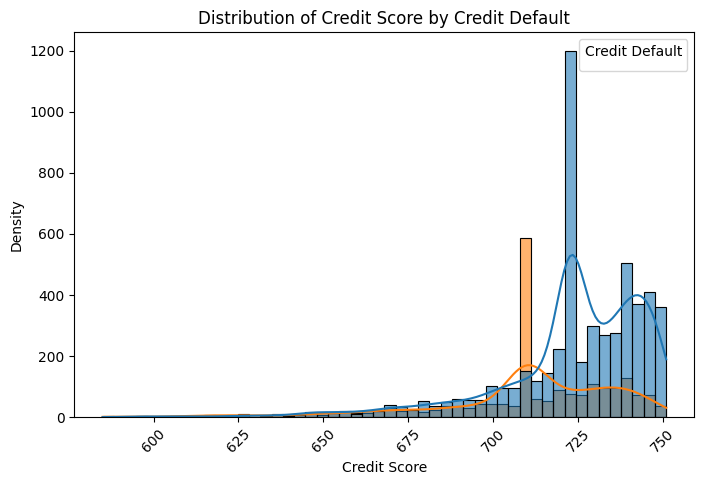

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



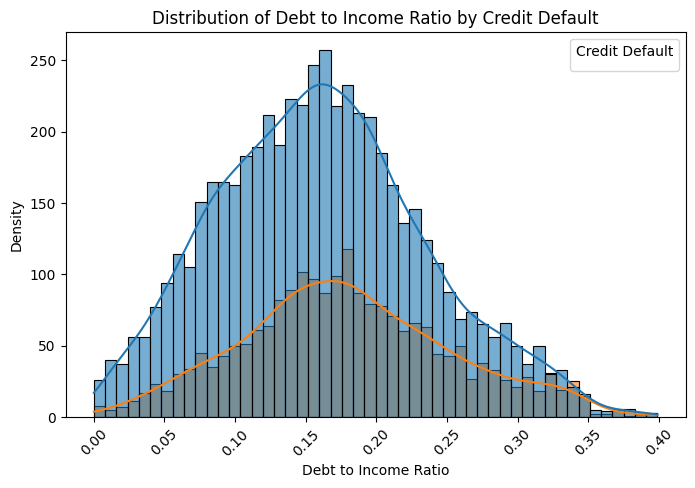

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



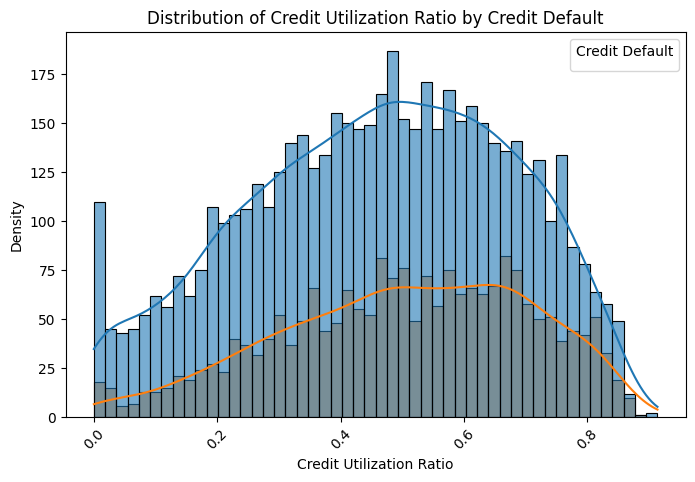

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



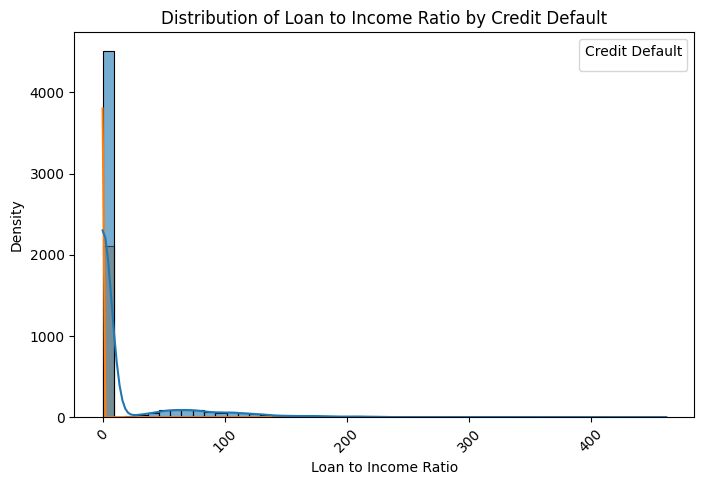

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



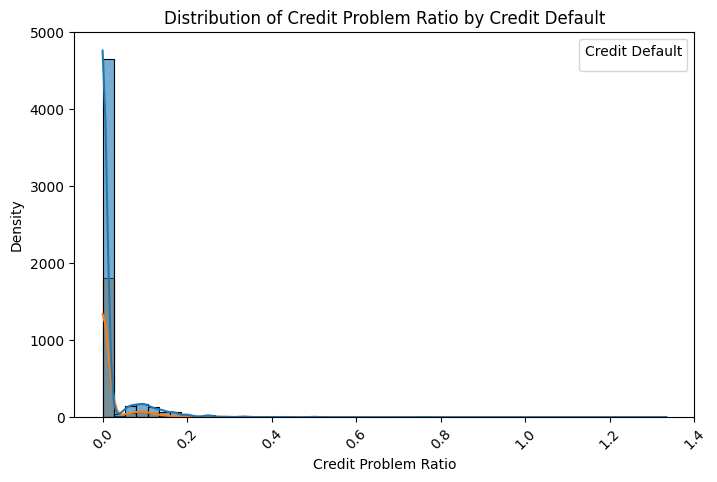

<ipython-input-42-d7a8e6e9fd1b>:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



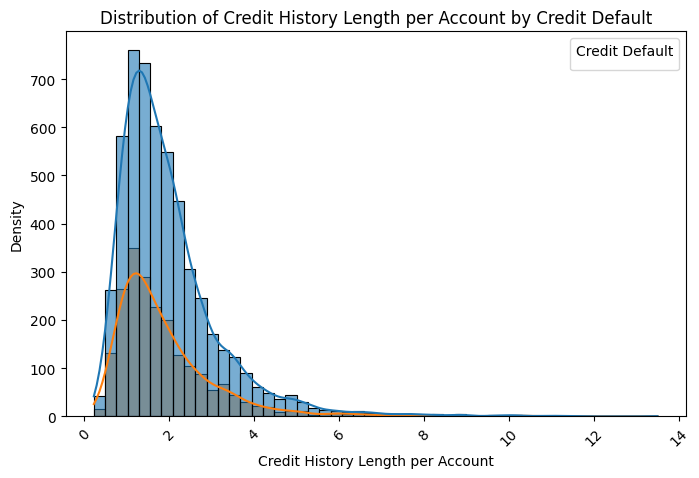

In [ ]:
for num_col in numFeature:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=dfEda, x=num_col, hue="Credit Default", kde=True, bins=50, alpha=0.6)

    plt.title(f"Distribution of {num_col} by Credit Default")
    plt.xlabel(num_col)
    plt.ylabel("Density")
    plt.xticks(rotation=45)

    plt.legend(title="Credit Default")
    plt.show()

1. **Distribution of Annual Income by Credit Default**
*   The distribution is right-skewed, meaning most borrowers have lower annual incomes.
*   The non-defaulted group (likely represented by the dominant blue curve) has a peak at a higher income range than the defaulted group (orange curve).
*   The defaulted borrowers have a more concentrated distribution towards the lower-income range, suggesting that lower-income individuals are more likely to default.
*   Higher-income individuals seem less likely to default, as their distribution extends further to the right with lower density in the defaulted group.
*   Business Implication:
Income level plays a crucial role in predicting loan default. Borrowers with lower annual incomes may struggle to meet repayment obligations. A risk management strategy could involve stricter creditworthiness checks or tailored loan terms for lower-income applicants.

2. **Distribution of Years in Current Job by Credit Default**
*   The distribution appears more categorical, with peaks at specific values (e.g., 1, 2, 5, and 10 years).
*   Borrowers with fewer years in their current job (1–3 years) seem to have a higher density in the defaulted group.
*   Borrowers with longer job tenure (especially around 10 years) are more represented in the non-defaulted group, indicating job stability reduces default risk.
*   The defaulted group’s distribution is more spread out and appears to have higher density in the lower tenure range.
*   Business Implication:
Job stability is an important factor in assessing credit risk. Borrowers with longer employment history may have more stable income, reducing their likelihood of default. Financial institutions could consider job tenure as a key variable in risk assessment and possibly require additional guarantees for those with shorter job histories.

3. **Distribution of Tax Liens by Credit Default**
*   The vast majority of borrowers have zero tax liens, creating a sharp peak at 0.
*   A very small number of borrowers have 1 or more tax liens, making the distribution highly skewed.
*   The defaulted group (likely the orange line) appears slightly more represented among those with non-zero tax liens.
*   Business Implication:
Since most borrowers have no tax liens, this feature might not add much predictive power.

4. **Distribution of Number of Open Accounts by Credit Default**
*   The distribution is right-skewed, meaning most borrowers have a moderate number of open accounts.
*   The non-defaulted group (blue line) peaks around 10–15 open accounts.
*   The defaulted group (orange line) has a more spread-out distribution, with a higher proportion of defaulters having fewer accounts (below ~10) and slightly more representation in higher account ranges (20+).
*   Default risk seems to increase at both extremes—borrowers with too few or too many open accounts may be at higher risk.
*   Business Implication:
A low number of open accounts could indicate limited credit history, making borrowers riskier. Conversely, too many open accounts may signal over-leverage. Loan providers might consider an optimal range of open accounts when assessing creditworthiness.

5. **Distribution of Years of Credit History by Credit Default**
*   The distribution is right-skewed, meaning most borrowers have shorter credit histories.
*   The non-defaulted group (blue line) has a peak around 10–15 years of credit history.
*   The defaulted group (orange line) is also concentrated in the same range but appears more spread out.
*   Borrowers with very short credit histories (below ~5 years) seem more likely to default.
*   Those with longer credit histories (20+ years) have a lower default probability, but defaults still exist across all ranges.
*   Business Implication:
Longer credit histories generally indicate better financial behavior and lower default risk. Loan providers might consider giving lower credit scores to borrowers with very short credit histories.





6. **Distribution of Maximum Open Credit by Credit Default**
*   The distribution is highly skewed, with a majority of borrowers having low maximum open credit.
*   A very small number of individuals have extremely high credit limits, which skews the scale.
*   The defaulted group (orange line) seems to have a slightly higher density at lower credit limits.
*   This plot suggests that most borrowers, regardless of default status, have relatively low maximum open credit.
*   Business Implication:
Since most data points are clustered near low credit limits, financial institutions should analyze outliers separately. Extremely high open credit limits might indicate either high financial trustworthiness or risky over-leverage.

7. **Distribution of Number of Credit Problems by Credit Default**
*   List itemThe distribution is highly skewed, with most individuals having 0 credit problems.
*   List itemA small number of borrowers have 1 or more credit problems, but they are much fewer in number.
*   List itemThe defaulted group (orange line) shows a slightly higher density for borrowers with 1+ credit problems, though defaults still occur among those with 0 problems.
*   List itemBusiness Implication:
Having credit problems (e.g., late payments, charge-offs, bankruptcies) increases default risk, but many defaulters have no recorded credit problems.





8. **Distribution of Months Since Last Delinquent by Credit Default**
*   The distribution has a sharp peak around 35–40 months, suggesting many borrowers last had a delinquency within that period.
*   The defaulted group (orange line) has a higher density in the lower month ranges, meaning recent delinquencies correlate with higher default risk.
*   Some borrowers have very long periods (80+ months) since their last delinquency, which may indicate credit recovery.
*   Business Implication:
Borrowers who recently had delinquencies (e.g., <12 months) might be at a higher risk of default, while those with older delinquencies (e.g., 5+ years ago) may have improved their credit behavior.





9. **Distribution of Current Loan Amount by Credit Default**
*   The distribution is highly skewed, with most borrowers having small loan amounts.
*   There is a significant outlier cluster at around 100 million (likely large commercial loans or errors in data).
*   The defaulted group (orange line) shows a slight increase in density for those with higher loan amounts.
*   Business Implication:
Borrowers with very high loan amounts might be at a higher risk of default.




10. **Distribution of Current Credit Balance by Credit Default**
*   The distribution is right-skewed, meaning most borrowers have low credit balances, while a few have very high balances.
*   Defaulted borrowers tend to have higher credit balances.
*   There is a gradual decrease in density as credit balance increases, but defaults (orange line) appear more frequent at higher balances.
*   Business Implication:
Borrowers with higher outstanding balances tend to default more frequently.





11. **Distribution of Monthly Debt by Credit Default**
*   The distribution is right-skewed, meaning most individuals have low monthly debt, but a few have very high amounts.
*   The defaulting group (orange line) has a higher density in the lower-to-mid debt range (~10,000-30,000) but declines afterward.
*   Some extreme outliers exist beyond 100,000+ in monthly debt.
*   Business Implication:
Higher monthly debt could indicate a higher risk of default.
There might be a threshold (~30,000-40,000) where default risk increases significantly.






12. **Distribution of Credit Score by Credit Default**
*   The distribution is left-skewed, meaning most individuals have high credit scores (~700-750).
*   There is a sharp peak around 720—possibly due to a common scoring threshold.
*   The defaulting group (orange line) has a higher density around scores of 675-700, suggesting lower scores correlate with higher default risk.
*   Business Implication:
Credit score is inversely related to default risk—borrowers with lower credit scores default more often.
The sharp peak at 720 suggests a cutoff point used in lending decisions.
Lenders should monitor borrowers with scores below 700 more closely.


13. **Distribution of Debt-to-Income Ratio by Credit Default**
*   The Debt-to-Income (DTI) ratio is right-skewed, with most values between 0.05 and 0.30.
*   The defaulting group (orange line) has a relatively higher density across the range, especially from 0.10 to 0.30.
*   Defaulting borrowers seem to peak around 0.15-0.25.
*   Business Implication:
Higher DTI correlates with higher default risk—borrowers with DTI beyond 0.15-0.20 should be closely monitored.
Most defaults occur in the range of 0.10-0.30, suggesting a potential threshold for lenders to adjust risk assessment models.



14. **Distribution of Credit Utilization Ratio by Credit Default**
*   Credit utilization ratio is distributed roughly normally, peaking around 40-60% utilization.
*   The defaulting group (orange line) appears more prevalent above 50% utilization, indicating higher risk at higher utilization levels.
*   There are some borrowers with very low utilization (~0-10%), which may represent either highly creditworthy individuals or inactive accounts.
*   Business Implication:
Higher credit utilization is linked to higher default risk—defaulting borrowers are more concentrated in the 50-80% range.
Borrowers with utilization below 30% seem to have lower default rates, supporting the industry recommendation of keeping utilization under 30%.

15. **Distribution of Loan-to-Income Ratio by Credit Default**
*   The Loan-to-Income (LTI) ratio is highly right-skewed, with most values concentrated near 0-10 and a long tail extending beyond 100.
*   The defaulting group (orange line) closely follows the non-defaulting group but is slightly more prevalent at higher LTI values.
*   The extreme values (above 100) might indicate outliers or special loan cases.
*   Business Implication:
Most borrowers have an LTI ratio below 10, meaning they have manageable loan burdens.
Defaulting borrowers are more common at higher LTI values, suggesting that high LTI is a risk factor.




16. **Distribution of Credit Problem Ratio by Credit Default**
*   The Credit Problem Ratio is also highly skewed, with most values close to 0.
*   A small fraction of borrowers have nonzero credit problems, and their density decreases rapidly beyond 0.2.
*   The defaulting group (orange line) is more concentrated around small nonzero values, indicating that even a small credit problem increases the risk of default.
*   Business Implication:
Most borrowers have near-zero credit problems, meaning a clean credit history is common.
Even small credit problems significantly increase default risk, suggesting that any credit issue should be a red flag.

17. **Distribution of Credit History Length per Account by Credit Default**
*   The Credit History Length per Account is right-skewed, with most values between 0 and 5 years.
*   Non-defaulting borrowers (blue line) have longer credit histories on average.
Defaulting borrowers (orange line) have shorter credit histories, with a peak around 1-2 years.
*   Very few accounts have a credit history beyond 6 years.
*   Business Implications:
Borrowers with less than 2 years of credit history are more likely to default.
Shorter credit histories indicate higher uncertainty, making them riskier for lenders.



## Categorical Feature

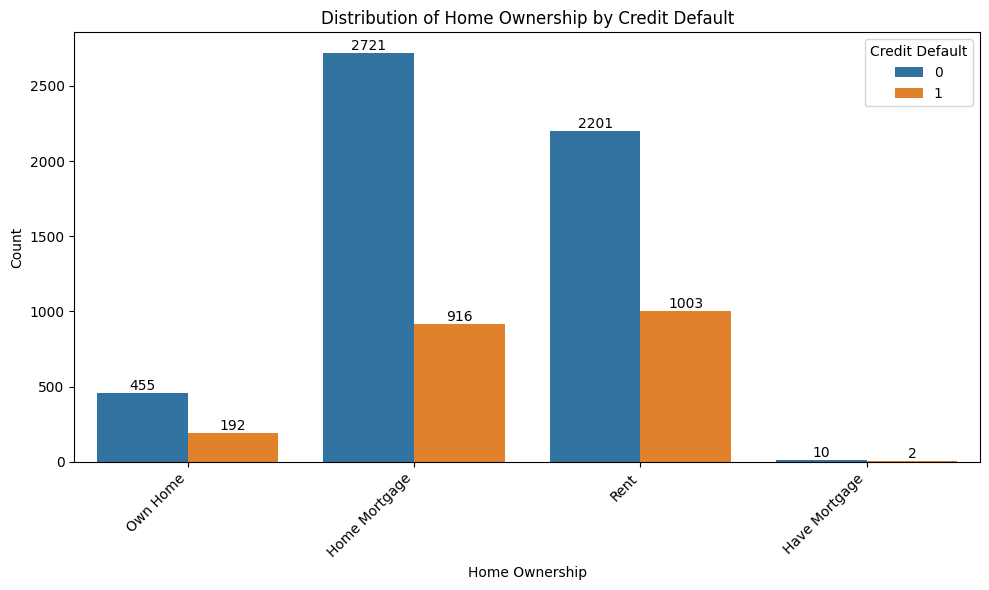

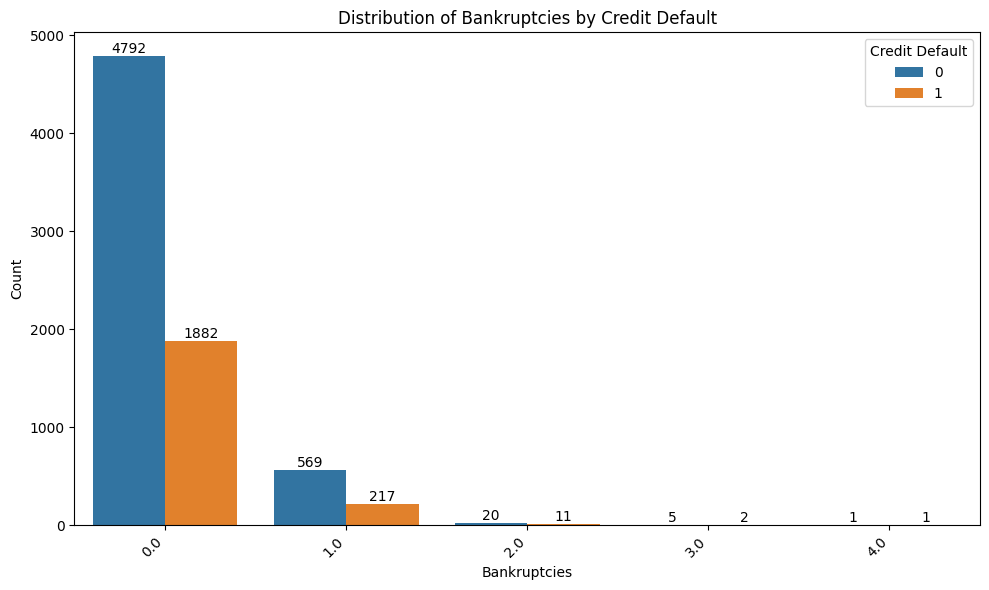

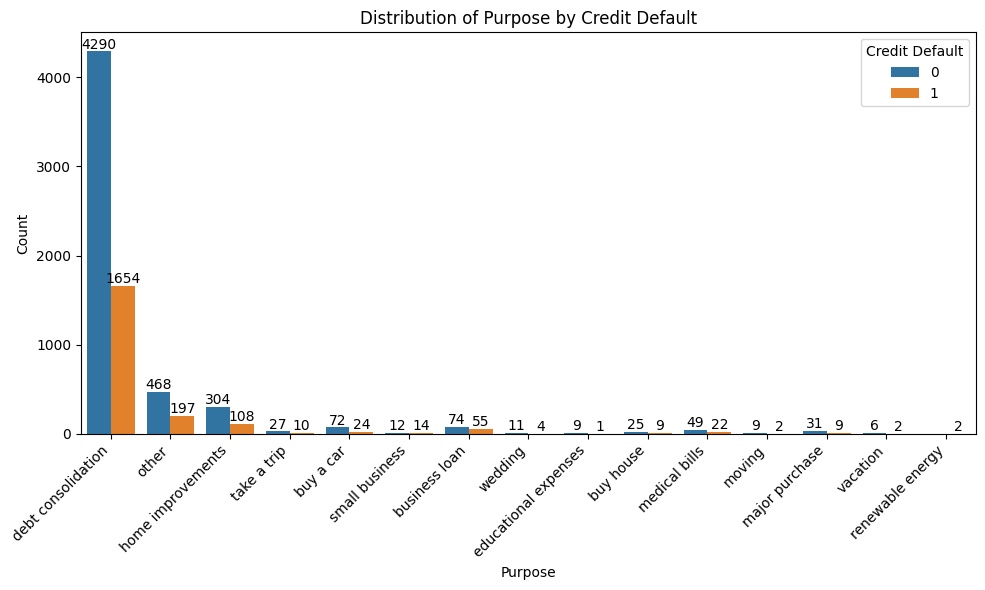

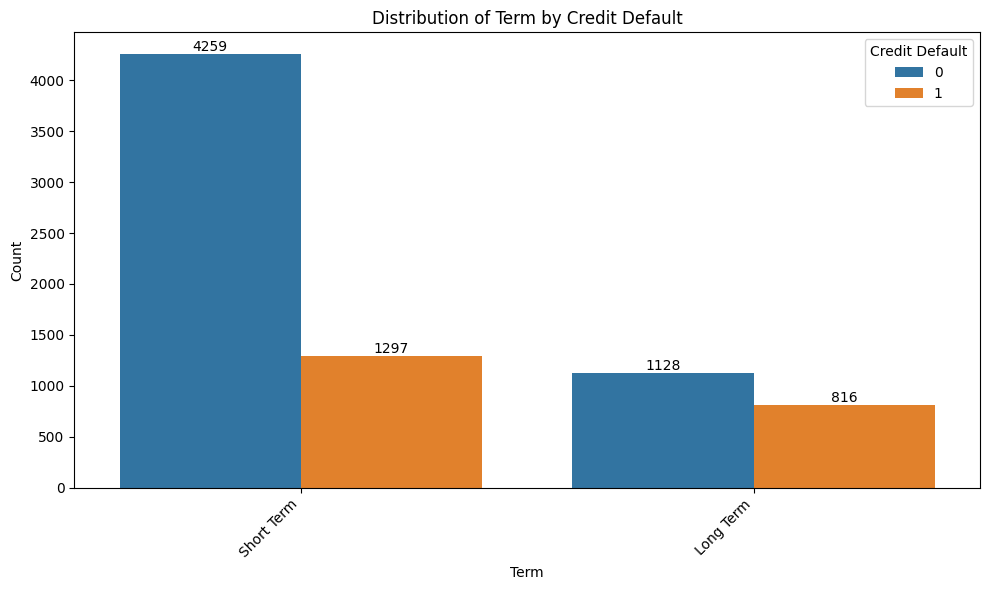

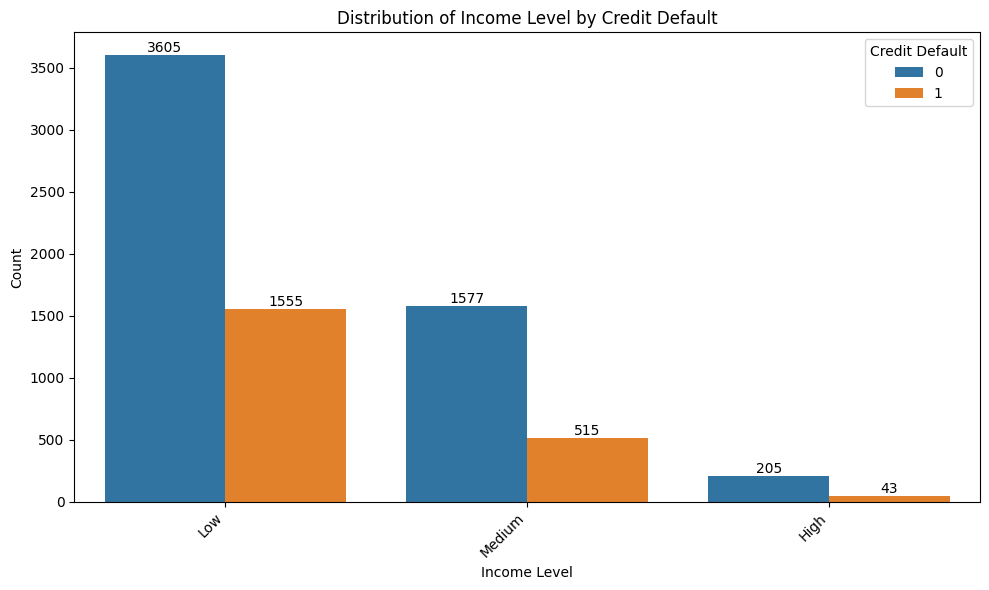

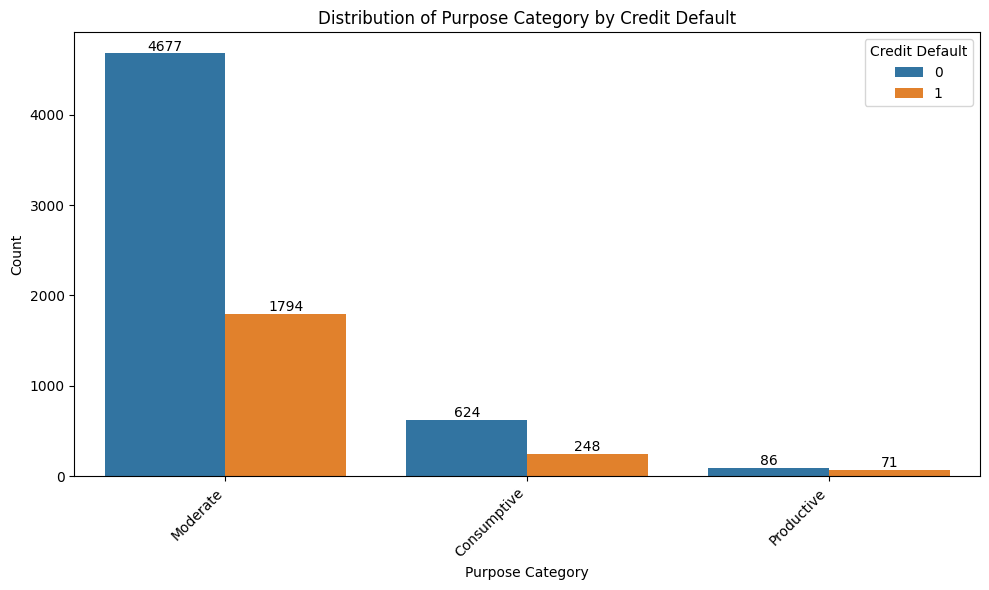

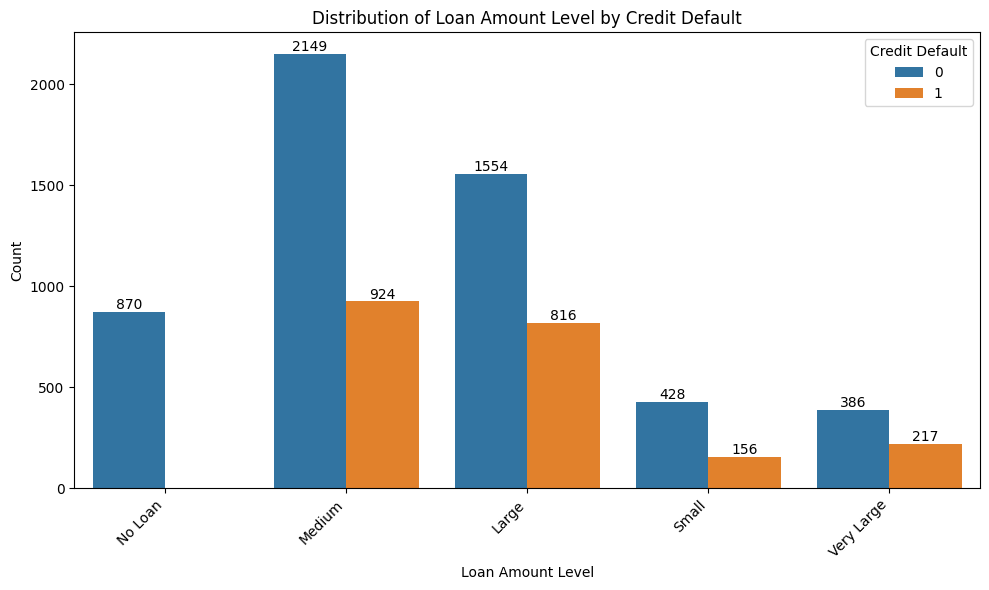

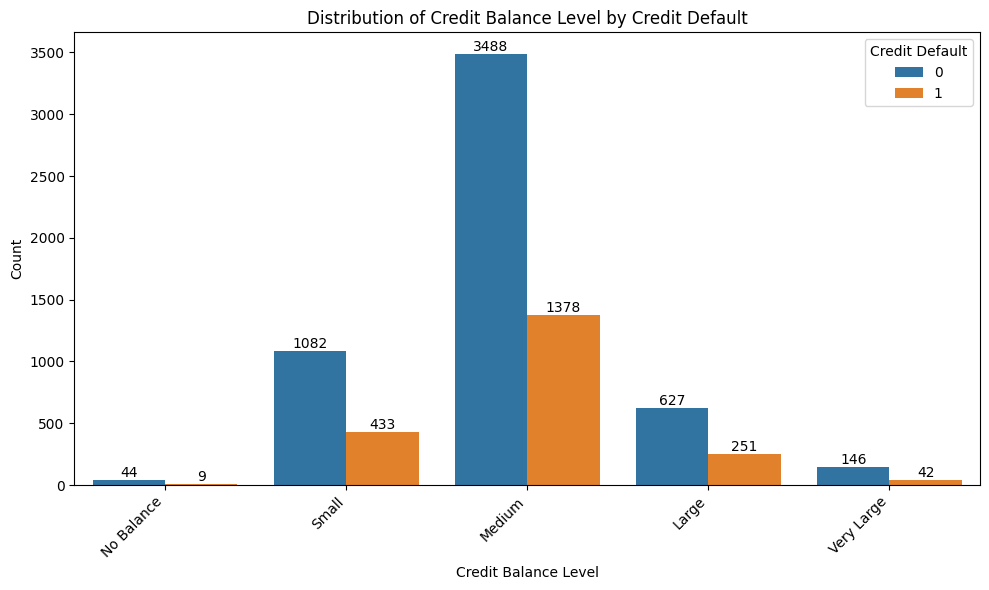

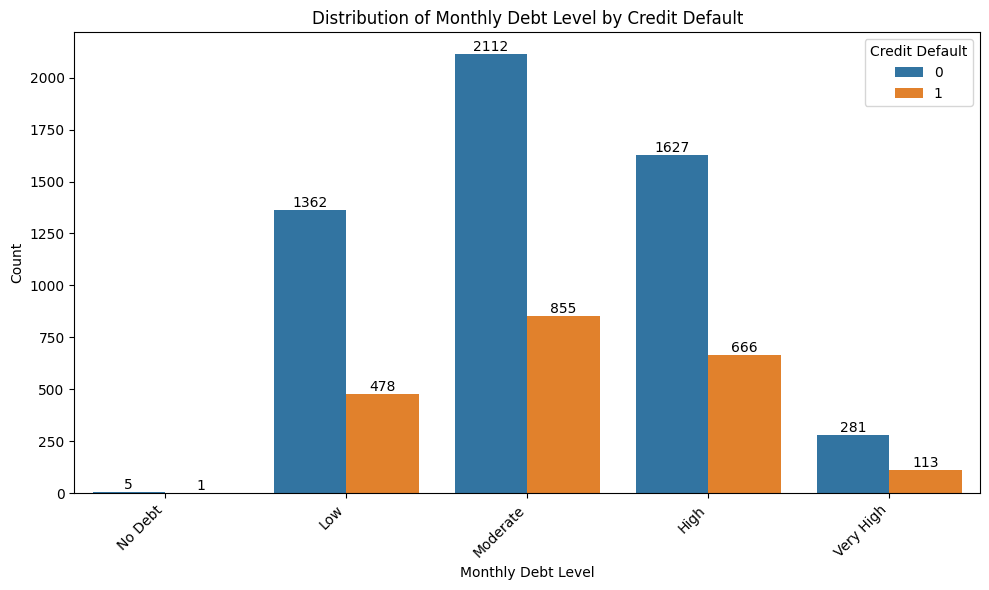

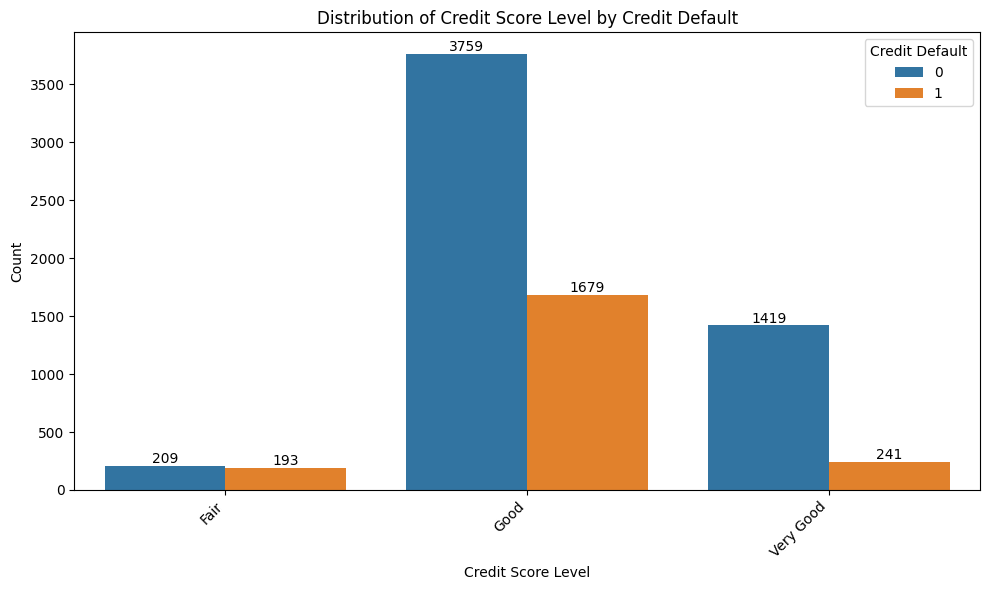

In [ ]:
for col in catFeature:
    target_col = "Credit Default"
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=col, hue=target_col, data=dfEda)
    plt.title(f"Distribution of {col} by {target_col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45, ha='right')

    # Add labels on top of bars
    for p in ax.patches:
        height = p.get_height()
        if height > 0: #prevent label for zero height bars
            ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='center', xytext=(0, 5), textcoords='offset points')

    plt.tight_layout()
    plt.show()

1. **Distribution of Home Ownership by Credit Default**
*   Home Mortgage is the most common category, followed by Rent and Own Home.
*   Default rates appear higher among those who Rent (1003 defaults out of 2201) compared to those with a Home Mortgage (916 defaults out of 2721).
*   Individuals who Own Home have the lowest number of defaults (192 out of 455), suggesting that homeownership might be a factor associated with lower default risk.



2. **Distribution of Bankruptcies by Credit Default**
*   Most individuals have zero bankruptcies, but the proportion of defaults increases with the number of bankruptcies.
*   Among those with zero bankruptcies, 1882 individuals defaulted, showing that even individuals with no bankruptcies can still default.
*   The default rate is much higher for individuals with one or more bankruptcies, indicating a strong correlation between bankruptcy history and credit default risk.

3. **Distribution of Purpose Category by Credit Default**
*   The majority of loans are taken for debt consolidation, followed by other, home improvements, and buying a car.
*   Debt consolidation loans also have the highest number of defaults, but this may be due to their high volume.
*   Categories like vacation, renewable energy, and wedding loans have very few borrowers, making it difficult to assess their default risk meaningfully.
*   Small business loans show a notable number of defaults, which might indicate higher risk in this category.

4. **Distribution of Term by Credit Default**
*   Short-term loans (4259 non-defaults, 1297 defaults) are much more common than long-term loans.
*   The proportion of defaults appears higher in long-term loans (816 defaults out of 1944 total) compared to short-term loans.
*   This suggests that long-term loans may carry a slightly higher risk of default, possibly due to financial uncertainties over extended periods.

5. **Distribution of Income Level by Credit Default**
*   Low-income borrowers have the highest number of loan applications (3605 non-defaults, 1555 defaults). They also have the highest number of defaults, suggesting higher financial vulnerability.
*   Medium-income borrowers (1577 non-defaults, 515 defaults) show a lower absolute number of defaults, but further analysis would be needed to compare default rates.
*   High-income borrowers have the fewest loans and the lowest default count (43 defaults), indicating they are at the lowest risk of default.

6. **Distribution of Purpose Category by Credit Default**
*   The "Moderate" purpose category (likely including debt consolidation and home improvement) is the most common and has the highest number of defaults (1794 out of 6471 total).
*   The "Consumptive" category (likely including vacations and luxury expenses) has a smaller number of defaults (248), but the proportion of defaults could still be concerning.
*   The "Productive" category (possibly related to business or investment purposes) has the lowest number of defaults (71), suggesting that loans used for productive purposes may be lower-risk.

7. **Distribution of Loan Amount Level by Credit Default**
*   Medium loan amounts have the highest number of loans (2149 non-defaults, 924 defaults), indicating this is a common loan size.
*   Large loan amounts also have a significant number of defaults (816 out of 2370 total), showing increased risk.
*   Small loans have the lowest number of defaults (156), suggesting lower risk for smaller amounts.
*   Very large loans show a relatively high default proportion (217 defaults out of 603 total).

8. **Distribution of Credit Balance Level by Credit Default**
*   Medium credit balances are the most common and have the highest number of defaults (1378 out of 4866 total).
*   Small credit balances have fewer defaults (433), indicating a lower risk.
*   Very large balances have a smaller total count but show some risk (42 defaults).
*   No balance category has minimal defaults, which could indicate responsible credit management.

9. **Distribution of Monthly Debt Level by Credit Default**
*   High monthly debt borrowers have a relatively high number of defaults (666 out of 2293 total).
*   Moderate debt levels have the most total borrowers but also a high number of defaults (855 out of 2967 total).
*   Very high debt levels have the fewest borrowers, but the proportion of defaults (113 out of 394 total) is still concerning.
*   Low debt levels show fewer defaults (478 out of 1840 total), indicating lower financial strain.

10. **Distribution of Credit Score Level by Credit Default**
*   Borrowers with a "Good" credit score default the most (1679 out of 5438 total).
*   "Very Good" credit score borrowers default less frequently (241 out of 1660 total), showing lower risk.
*   "Fair" credit score borrowers have fewer total applicants, but the default percentage (193 out of 402) seems high.

# **Modeling**

In [ ]:
dfModel = dfEda.copy()

## Modeling Preparation

### Encoding

Before training the model, categorical features must be converted into numerical format. **Label Encoding** is used to assign a unique integer to each category within a feature. This method is chosen because it is **simple**, **memory-efficient**, and **suitable for tree-based models** like decision trees and gradient boosting, which can handle categorical relationships effectively.

By applying Label Encoding, the categorical variables are transformed into a format that the model can process while preserving their distinct categories.


In [ ]:
dfModelLabel = dfModel.copy()

In [ ]:
def encodeFeature(df):
    df = df.copy()
    le = LabelEncoder()

    label_mapping = {
        'Income Level': {'Low': 0, 'Medium': 1, 'High': 2},
        'Loan Amount Level': {'No Loan': 0, 'Small': 1, 'Medium': 2, 'Large': 3, 'Very Large': 4},
        'Credit Balance Level': {'No Balance': 0, 'Small': 1, 'Medium': 2, 'Large': 3, 'Very Large': 4},
        'Monthly Debt Level': {'No Debt': 0, 'Low': 1, 'Moderate': 2, 'High': 3, 'Very High': 4},
        'Credit Score Level': {'Fair': 0, 'Good': 1, 'Very Good': 2},
        'Purpose Category': {'Consumptive': 0, 'Moderate': 1, 'Productive': 2}
    }

    # Features with clear levels: Manual encoding based on mapping
    for feature, mapping in label_mapping.items():
        df[feature + ' - Label'] = df[feature].map(mapping).astype('Int64')

    # Features that don't have a level: Use LabelEncoder
    non_ordered_features = ['Home Ownership', 'Purpose', 'Term']
    label_encoder = LabelEncoder()

    for feature in non_ordered_features:
        df[feature + ' - Label'] = label_encoder.fit_transform(df[feature])

    return df, label_mapping

In [ ]:
dfModelLabel, labelMapping = encodeFeature(dfModelLabel)
dfModelLabel

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Months since last delinquent,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Debt to Income Ratio,Credit Utilization Ratio,Loan to Income Ratio,Credit Problem Ratio,Credit History Length per Account,Income Level,Loan Amount Level,Credit Balance Level,Monthly Debt Level,Credit Score Level,Purpose Category,Income Level - Label,Loan Amount Level - Label,Credit Balance Level - Label,Monthly Debt Level - Label,Credit Score Level - Label,Purpose Category - Label,Home Ownership - Label,Purpose - Label,Term - Label
0,Own Home,482087,10,0.0,11.0,26.3,685960.0,1.0,1.0,32.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749,0,0.196993,0.069080,207.431437,0.090909,2.390909,Low,No Loan,Small,Low,Very Good,Moderate,0,0,1,1,2,1,2,3,1
1,Own Home,1025487,10,0.0,15.0,15.3,1181730.0,0.0,0.0,32.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737,1,0.214996,0.334232,0.258383,0.000000,1.020000,Low,Medium,Medium,Moderate,Good,Moderate,0,2,2,2,1,1,2,3,0
2,Home Mortgage,751412,8,0.0,11.0,35.0,1182434.0,0.0,0.0,32.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742,0,0.218006,0.260809,133.082781,0.000000,3.181818,Low,No Loan,Medium,Moderate,Very Good,Moderate,0,0,2,2,2,1,1,3,1
3,Own Home,805068,6,0.0,8.0,22.5,147400.0,1.0,1.0,32.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694,0,0.168999,0.650305,0.150790,0.125000,2.812500,Low,Medium,Small,Moderate,Good,Moderate,0,2,1,2,1,1,2,3,1
4,Rent,776264,8,0.0,13.0,13.6,385836.0,1.0,0.0,32.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719,0,0.110993,0.241836,0.162110,0.076923,1.046154,Low,Medium,Small,Low,Good,Moderate,0,2,1,1,1,1,3,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,402192,1,0.0,3.0,8.5,107866.0,0.0,0.0,32.0,other,Short Term,129360.0,73492.0,1900.0,697,0,0.056689,0.681327,0.321637,0.000000,2.833333,Low,Medium,Small,Low,Good,Consumptive,0,2,1,1,1,0,3,9,1
7496,Home Mortgage,1533984,1,0.0,10.0,26.5,686312.0,0.0,0.0,43.0,debt consolidation,Long Term,444048.0,456399.0,12783.0,741,1,0.099998,0.665002,0.289474,0.000000,2.650000,Medium,Large,Medium,Moderate,Very Good,Moderate,1,3,2,2,2,1,1,3,0
7497,Rent,1878910,6,0.0,12.0,32.1,1778920.0,0.0,0.0,32.0,buy a car,Short Term,99999999.0,477812.0,12479.0,748,0,0.079699,0.268597,53.222346,0.000000,2.675000,Medium,No Loan,Medium,Moderate,Very Good,Consumptive,1,0,2,2,2,0,3,1,1
7498,Home Mortgage,2116131,1,0.0,21.0,26.5,1141250.0,0.0,0.0,32.0,debt consolidation,Short Term,615274.0,476064.0,37118.0,723,0,0.210486,0.417143,0.290754,0.000000,1.261905,Medium,Very Large,Medium,High,Good,Moderate,1,4,2,3,1,1,1,3,1


In [ ]:
labelMapping

{'Income Level': {'Low': 0, 'Medium': 1, 'High': 2},
 'Loan Amount Level': {'No Loan': 0,
  'Small': 1,
  'Medium': 2,
  'Large': 3,
  'Very Large': 4},
 'Credit Balance Level': {'No Balance': 0,
  'Small': 1,
  'Medium': 2,
  'Large': 3,
  'Very Large': 4},
 'Monthly Debt Level': {'No Debt': 0,
  'Low': 1,
  'Moderate': 2,
  'High': 3,
  'Very High': 4},
 'Credit Score Level': {'Fair': 0, 'Good': 1, 'Very Good': 2},
 'Purpose Category': {'Consumptive': 0, 'Moderate': 1, 'Productive': 2}}

In [ ]:
dfModelLabel["Income Level - Label"] = dfModelLabel["Income Level - Label"].astype(int)
dfModelLabel["Loan Amount Level - Label"] = dfModelLabel["Loan Amount Level - Label"].astype(int)
dfModelLabel["Credit Balance Level - Label"] = dfModelLabel["Credit Balance Level - Label"].astype(int)
dfModelLabel["Monthly Debt Level - Label"] = dfModelLabel["Monthly Debt Level - Label"].astype(int)
dfModelLabel["Credit Score Level - Label"] = dfModelLabel["Credit Score Level - Label"].astype(int)
dfModelLabel["Purpose Category"] = dfModelLabel["Purpose Category - Label"].astype(int)

### Transformation

**Log transformation** is applied to the following features to **handle skewness** and **reduce** the impact of **outliers**.

This transformation helps normalize the data distribution, making it more suitable for modeling. By reducing the effect of large values, the model can better capture patterns and relationships in the data.


In [ ]:
dfModelTransform = dfModelLabel.copy()

In [ ]:
column_order = [
    # Basinc Applicant Information
    'Home Ownership', 'Home Ownership - Label', 'Annual Income', 'Income Level - Label', 'Income Level', 'Years in current job',

    # Credit Information and Payment History
    'Credit Score', 'Credit Score Level', 'Credit Score Level - Label', 'Number of Open Accounts',
    'Years of Credit History', 'Credit History Length per Account',
    'Months since last delinquent',
    'Number of Credit Problems', 'Credit Problem Ratio', 'Bankruptcies',
    'Tax Liens',

    # Loan Information and Credit Balance
    'Current Loan Amount', 'Loan Amount Level', 'Loan Amount Level - Label',
    'Current Credit Balance', 'Credit Balance Level', 'Credit Balance Level - Label',
    'Maximum Open Credit', 'Monthly Debt', 'Monthly Debt Level', 'Monthly Debt Level - Label',

    # Financial Ratios
   'Debt to Income Ratio', 'Credit Utilization Ratio', 'Loan to Income Ratio',

    # Loan Purpose
    'Purpose', 'Purpose - Label', 'Purpose Category','Purpose Category - Label',

    # Additional Information
    'Term', 'Term - Label', 'Credit Default'
]

dfModelTransform = dfModelTransform[column_order]
dfModelTransform

,Home Ownership,Home Ownership - Label,Annual Income,Income Level - Label,Income Level,Years in current job,Credit Score,Credit Score Level,Credit Score Level - Label,Number of Open Accounts,Years of Credit History,Credit History Length per Account,Months since last delinquent,Number of Credit Problems,Credit Problem Ratio,Bankruptcies,Tax Liens,Current Loan Amount,Loan Amount Level,Loan Amount Level - Label,Current Credit Balance,Credit Balance Level,Credit Balance Level - Label,Maximum Open Credit,Monthly Debt,Monthly Debt Level,Monthly Debt Level - Label,Debt to Income Ratio,Credit Utilization Ratio,Loan to Income Ratio,Purpose,Purpose - Label,Purpose Category,Purpose Category - Label,Term,Term - Label,Credit Default
0,Own Home,2,482087,0,Low,10,749,Very Good,2,11.0,26.3,2.390909,32.0,1.0,0.090909,1.0,0.0,99999999.0,No Loan,0,47386.0,Small,1,685960.0,7914.0,Low,1,0.196993,0.069080,207.431437,debt consolidation,3,1,1,Short Term,1,0
1,Own Home,2,1025487,0,Low,10,737,Good,1,15.0,15.3,1.020000,32.0,0.0,0.000000,0.0,0.0,264968.0,Medium,2,394972.0,Medium,2,1181730.0,18373.0,Moderate,2,0.214996,0.334232,0.258383,debt consolidation,3,1,1,Long Term,0,1
2,Home Mortgage,1,751412,0,Low,8,742,Very Good,2,11.0,35.0,3.181818,32.0,0.0,0.000000,0.0,0.0,99999999.0,No Loan,0,308389.0,Medium,2,1182434.0,13651.0,Moderate,2,0.218006,0.260809,133.082781,debt consolidation,3,1,1,Short Term,1,0
3,Own Home,2,805068,0,Low,6,694,Good,1,8.0,22.5,2.812500,32.0,1.0,0.125000,1.0,0.0,121396.0,Medium,2,95855.0,Small,1,147400.0,11338.0,Moderate,2,0.168999,0.650305,0.150790,debt consolidation,3,1,1,Short Term,1,0
4,Rent,3,776264,0,Low,8,719,Good,1,13.0,13.6,1.046154,32.0,1.0,0.076923,0.0,0.0,125840.0,Medium,2,93309.0,Small,1,385836.0,7180.0,Low,1,0.110993,0.241836,0.162110,debt consolidation,3,1,1,Short Term,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,3,402192,0,Low,1,697,Good,1,3.0,8.5,2.833333,32.0,0.0,0.000000,0.0,0.0,129360.0,Medium,2,73492.0,Small,1,107866.0,1900.0,Low,1,0.056689,0.681327,0.321637,other,9,0,0,Short Term,1,0
7496,Home Mortgage,1,1533984,1,Medium,1,741,Very Good,2,10.0,26.5,2.650000,43.0,0.0,0.000000,0.0,0.0,444048.0,Large,3,456399.0,Medium,2,686312.0,12783.0,Moderate,2,0.099998,0.665002,0.289474,debt consolidation,3,1,1,Long Term,0,1
7497,Rent,3,1878910,1,Medium,6,748,Very Good,2,12.0,32.1,2.675000,32.0,0.0,0.000000,0.0,0.0,99999999.0,No Loan,0,477812.0,Medium,2,1778920.0,12479.0,Moderate,2,0.079699,0.268597,53.222346,buy a car,1,0,0,Short Term,1,0
7498,Home Mortgage,1,2116131,1,Medium,1,723,Good,1,21.0,26.5,1.261905,32.0,0.0,0.000000,0.0,0.0,615274.0,Very Large,4,476064.0,Medium,2,1141250.0,37118.0,High,3,0.210486,0.417143,0.290754,debt consolidation,3,1,1,Short Term,1,0


In [ ]:
def logTransform(df, columns):

    dfTransformed = df.copy()
    for col in columns:
        dfTransformed[col] = np.log1p(dfTransformed[col])
    return dfTransformed

log_columns = [
    "Annual Income",
    "Credit History Length per Account",
    "Current Loan Amount",
    "Current Credit Balance",
    "Maximum Open Credit",
    "Monthly Debt",
    "Loan to Income Ratio"
]

dfModelTransform = logTransform(dfModelTransform, log_columns)

dfModelTransform

,Home Ownership,Home Ownership - Label,Annual Income,Income Level - Label,Income Level,Years in current job,Credit Score,Credit Score Level,Credit Score Level - Label,Number of Open Accounts,Years of Credit History,Credit History Length per Account,Months since last delinquent,Number of Credit Problems,Credit Problem Ratio,Bankruptcies,Tax Liens,Current Loan Amount,Loan Amount Level,Loan Amount Level - Label,Current Credit Balance,Credit Balance Level,Credit Balance Level - Label,Maximum Open Credit,Monthly Debt,Monthly Debt Level,Monthly Debt Level - Label,Debt to Income Ratio,Credit Utilization Ratio,Loan to Income Ratio,Purpose,Purpose - Label,Purpose Category,Purpose Category - Label,Term,Term - Label,Credit Default
0,Own Home,2,13.085882,0,Low,10,749,Very Good,2,11.0,26.3,1.221098,32.0,1.0,0.090909,1.0,0.0,18.420681,No Loan,0,10.766103,Small,1,13.438576,8.976515,Low,1,0.196993,0.069080,5.339610,debt consolidation,3,1,1,Short Term,1,0
1,Own Home,2,13.840679,0,Low,10,737,Good,1,15.0,15.3,0.703098,32.0,0.0,0.000000,0.0,0.0,12.487368,Medium,2,12.886573,Medium,2,13.982491,9.818692,Moderate,2,0.214996,0.334232,0.229827,debt consolidation,3,1,1,Long Term,0,1
2,Home Mortgage,1,13.529711,0,Low,8,742,Very Good,2,11.0,35.0,1.430746,32.0,0.0,0.000000,0.0,0.0,18.420681,No Loan,0,12.639120,Medium,2,13.983086,9.521641,Moderate,2,0.218006,0.260809,4.898457,debt consolidation,3,1,1,Short Term,1,0
3,Own Home,2,13.598683,0,Low,6,694,Good,1,8.0,22.5,1.338285,32.0,1.0,0.125000,1.0,0.0,11.706821,Medium,2,11.470602,Small,1,11.900912,9.336003,Moderate,2,0.168999,0.650305,0.140448,debt consolidation,3,1,1,Short Term,1,0
4,Rent,3,13.562249,0,Low,8,719,Good,1,13.0,13.6,0.715962,32.0,1.0,0.076923,0.0,0.0,11.742774,Medium,2,11.443683,Small,1,12.863170,8.879194,Low,1,0.110993,0.241836,0.150237,debt consolidation,3,1,1,Short Term,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,3,12.904687,0,Low,1,697,Good,1,3.0,8.5,1.343735,32.0,0.0,0.000000,0.0,0.0,11.770362,Medium,2,11.204945,Small,1,11.588654,7.550135,Low,1,0.056689,0.681327,0.278871,other,9,0,0,Short Term,1,0
7496,Home Mortgage,1,14.243379,1,Medium,1,741,Very Good,2,10.0,26.5,1.294727,43.0,0.0,0.000000,0.0,0.0,13.003690,Large,3,13.031125,Medium,2,13.439089,9.455950,Moderate,2,0.099998,0.665002,0.254234,debt consolidation,3,1,1,Long Term,0,1
7497,Rent,3,14.446203,1,Medium,6,748,Very Good,2,12.0,32.1,1.301553,32.0,0.0,0.000000,0.0,0.0,18.420681,No Loan,0,13.076975,Medium,2,14.391518,9.431883,Moderate,2,0.079699,0.268597,3.993093,buy a car,1,0,0,Short Term,1,0
7498,Home Mortgage,1,14.565100,1,Medium,1,723,Good,1,21.0,26.5,0.816207,32.0,0.0,0.000000,0.0,0.0,13.329825,Very Large,4,13.073310,Medium,2,13.947636,10.521884,High,3,0.210486,0.417143,0.255227,debt consolidation,3,1,1,Short Term,1,0


### Deleting Unwanted Feature

**Categorical features** that have been **label-encoded** are **removed** from the dataset to **avoid redundancy**. Only the encoded versions of these features are retained for modeling. This ensures that the model works with numerical data while preventing potential issues like multicollinearity.

In [ ]:
dfModelDrop = dfModelTransform.copy()

In [ ]:
colToDrop = [
    "Home Ownership",
    "Income Level",
    "Credit Score Level",
    "Loan Amount Level",
    "Credit Balance Level",
    "Monthly Debt Level",
    "Purpose",
    "Purpose Category",
    "Term"
]

dfModelDrop = dfModelDrop.drop(columns=colToDrop)
dfModelDrop

,Home Ownership - Label,Annual Income,Income Level - Label,Years in current job,Credit Score,Credit Score Level - Label,Number of Open Accounts,Years of Credit History,Credit History Length per Account,Months since last delinquent,Number of Credit Problems,Credit Problem Ratio,Bankruptcies,Tax Liens,Current Loan Amount,Loan Amount Level - Label,Current Credit Balance,Credit Balance Level - Label,Maximum Open Credit,Monthly Debt,Monthly Debt Level - Label,Debt to Income Ratio,Credit Utilization Ratio,Loan to Income Ratio,Purpose - Label,Purpose Category - Label,Term - Label,Credit Default
0,2,13.085882,0,10,749,2,11.0,26.3,1.221098,32.0,1.0,0.090909,1.0,0.0,18.420681,0,10.766103,1,13.438576,8.976515,1,0.196993,0.069080,5.339610,3,1,1,0
1,2,13.840679,0,10,737,1,15.0,15.3,0.703098,32.0,0.0,0.000000,0.0,0.0,12.487368,2,12.886573,2,13.982491,9.818692,2,0.214996,0.334232,0.229827,3,1,0,1
2,1,13.529711,0,8,742,2,11.0,35.0,1.430746,32.0,0.0,0.000000,0.0,0.0,18.420681,0,12.639120,2,13.983086,9.521641,2,0.218006,0.260809,4.898457,3,1,1,0
3,2,13.598683,0,6,694,1,8.0,22.5,1.338285,32.0,1.0,0.125000,1.0,0.0,11.706821,2,11.470602,1,11.900912,9.336003,2,0.168999,0.650305,0.140448,3,1,1,0
4,3,13.562249,0,8,719,1,13.0,13.6,0.715962,32.0,1.0,0.076923,0.0,0.0,11.742774,2,11.443683,1,12.863170,8.879194,1,0.110993,0.241836,0.150237,3,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,3,12.904687,0,1,697,1,3.0,8.5,1.343735,32.0,0.0,0.000000,0.0,0.0,11.770362,2,11.204945,1,11.588654,7.550135,1,0.056689,0.681327,0.278871,9,0,1,0
7496,1,14.243379,1,1,741,2,10.0,26.5,1.294727,43.0,0.0,0.000000,0.0,0.0,13.003690,3,13.031125,2,13.439089,9.455950,2,0.099998,0.665002,0.254234,3,1,0,1
7497,3,14.446203,1,6,748,2,12.0,32.1,1.301553,32.0,0.0,0.000000,0.0,0.0,18.420681,0,13.076975,2,14.391518,9.431883,2,0.079699,0.268597,3.993093,1,0,1,0
7498,1,14.565100,1,1,723,1,21.0,26.5,0.816207,32.0,0.0,0.000000,0.0,0.0,13.329825,4,13.073310,2,13.947636,10.521884,3,0.210486,0.417143,0.255227,3,1,1,0


### Preparing Train and Test Data

The dataset is prepared for modeling by splitting it into features (**X**) and the target variable (**y**), where **Credit Default** is the target. The data is then divided into **80% training** and **20% testing** sets using **stratified sampling** to maintain the class distribution.

If the model used is not tree-based, feature standardization is applied using **StandardScaler** to normalize the data, ensuring a consistent scale and improving model performance.


In [ ]:
df = dfModelDrop.copy()

X = df.drop(columns=["Credit Default"])
y = df["Credit Default"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_train = X_train.astype({col: 'int64' for col in X_train.select_dtypes('Int64').columns})

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Modeling Plan
There are three model, tested under three different conditions to evaluate the impact of handling class imbalance in the target feature (**Credit Default**):
*   **Without Handling Imbalanced Data**

  The model is trained on the original dataset without any adjustments for class imbalance. This serves as a baseline to compare the effect of different balancing techniques.
*   **Handling with Cost-Sensitive Learning**

  The model incorporates class weighting, where higher misclassification penalties are assigned to the minority class. This helps the model learn from underrepresented cases without modifying the dataset.
*   **Handling with SMOTE (Synthetic Minority Over-sampling Technique)**

  The dataset is balanced using SMOTE, which generates synthetic samples for the minority class. This approach increases representation and improves the model’s ability to predict rare cases of Credit Default.




## Logistic Regression

### No Handling Imbalanced Data

=== Logistic Regression without Handling Imbalance ===
F1 Score: 0.2744
ROC-AUC Score: 0.7268

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.93      0.82      1077
           1       0.50      0.19      0.27       423

    accuracy                           0.72      1500
   macro avg       0.62      0.56      0.55      1500
weighted avg       0.68      0.72      0.67      1500



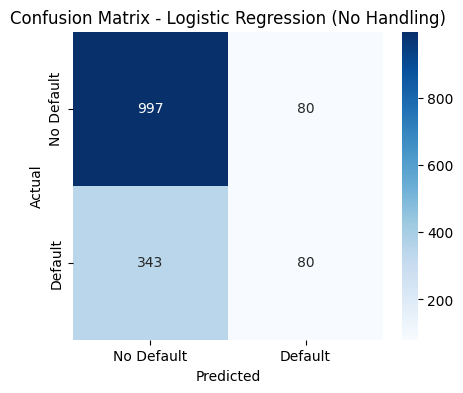

In [ ]:
model_lr = LogisticRegression(random_state=42)

model_lr.fit(X_train_scaled, y_train)

y_pred = model_lr.predict(X_test_scaled)
y_pred_proba = model_lr.predict_proba(X_test_scaled)[:, 1]

print("=== Logistic Regression without Handling Imbalance ===")
print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (No Handling)")
plt.show()

**Insights & Takeaways from Logistic Regression without Handling Imbalance**
1. Low F1 Score for the Positive Class (Credit Default)

  The F1 score of 0.2744 for the default class (1) indicates poor balance between precision and recall. This suggests that the model struggles to correctly identify loan defaulters while also minimizing false positives.

2. Imbalanced Performance Between Classes

  The precision for class 1 (default) is 0.50, meaning that when the model predicts a default, it is correct only half of the time.

3. Better Performance on Non-Defaulters

  For class 0 (non-default), the model performs well with a recall of 0.93, meaning it correctly identifies most non-defaulters. However, this comes at the cost of missing a large portion of actual defaulters.

4. ROC-AUC Score Indicates Moderate Discriminatory Power

  A ROC-AUC score of 0.7268 suggests that the model has some ability to differentiate between defaulters and non-defaulters, but it is far from optimal.

### Handling Imbalanced Data: Cost-Sensitive Learning

=== Logistic Regression with Cost-Sensitive Learning ===
F1 Score: 0.5290
ROC-AUC Score: 0.7287

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.63      0.72      1077
           1       0.43      0.70      0.53       423

    accuracy                           0.65      1500
   macro avg       0.63      0.66      0.62      1500
weighted avg       0.72      0.65      0.67      1500



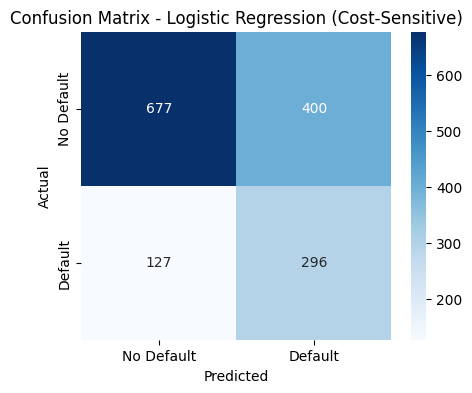

In [ ]:
model_lr_balanced = LogisticRegression(random_state=42, class_weight="balanced")

model_lr_balanced.fit(X_train_scaled, y_train)

y_pred_balanced = model_lr_balanced.predict(X_test_scaled)
y_pred_proba_balanced = model_lr_balanced.predict_proba(X_test_scaled)[:, 1]

print("=== Logistic Regression with Cost-Sensitive Learning ===")
print(f"F1 Score: {f1_score(y_test, y_pred_balanced):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba_balanced):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_balanced))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_balanced), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (Cost-Sensitive)")
plt.show()

**Insights & Takeaways from Cost-Sensitive Logistic Regression**

1. Significant Improvement in F1 Score for Loan Default Class

  The F1 score increased from 0.2744 to 0.5290, indicating a much better balance between precision and recall for identifying defaulters.

  This suggests that cost-sensitive learning effectively helped the model recognize defaulters while still maintaining reasonable precision.

2. Higher Recall for Defaulters, but Lower Precision

  Recall for class 1 (defaulters) improved from 0.19 to 0.70, meaning the model now captures 70% of actual defaulters, a major improvement.


3. Slight Drop in Accuracy and Performance on Non-Defaulters

  Overall accuracy dropped from 0.72 to 0.65, but this is acceptable given the focus on improving defaulter detection.
  The model now has lower recall for non-defaulters (0.63 vs. 0.93 previously), meaning some good customers are incorrectly classified as defaulters.

4. Minimal Change in ROC-AUC Score

  The ROC-AUC score increased slightly from 0.7268 to 0.7287, meaning the model’s overall discriminatory power remains similar.


### Handling Imbalanced Data: SMOTE

=== Logistic Regression with SMOTE ===
F1 Score: 0.5374
ROC-AUC Score: 0.7251

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.64      0.73      1077
           1       0.43      0.70      0.54       423

    accuracy                           0.66      1500
   macro avg       0.64      0.67      0.63      1500
weighted avg       0.73      0.66      0.67      1500



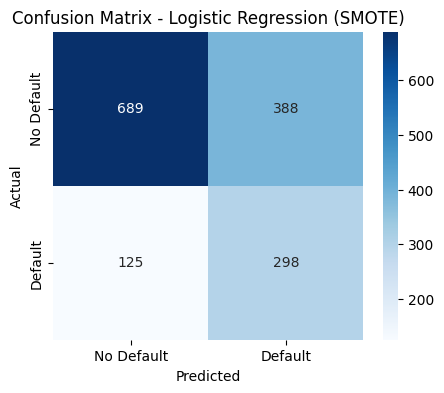

In [ ]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

model_lr_smote = LogisticRegression(random_state=42)

model_lr_smote.fit(X_train_smote, y_train_smote)

y_pred_smote = model_lr_smote.predict(X_test_scaled)
y_pred_proba_smote = model_lr_smote.predict_proba(X_test_scaled)[:, 1]

print("=== Logistic Regression with SMOTE ===")
print(f"F1 Score: {f1_score(y_test, y_pred_smote):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba_smote):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_smote))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_smote), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Logistic Regression (SMOTE)")
plt.show()


**Insights & Takeaways from Logistic Regression with SMOTE**

1. Slight Improvement in F1 Score

  The F1 score increased from 0.5290 (Cost-Sensitive) to 0.5374, showing that SMOTE helped balance precision and recall.

  Oversampling the minority class allowed the model to learn more about defaulters, improving its predictive power.

2. Higher Recall for Loan Defaulters, but Lower Precision

  Recall for class 1 (defaulters) remains at 0.70, meaning the model still captures 70% of actual defaulters—a significant improvement compared to the baseline model (0.19).

  Precision for defaulters remains at 0.43, similar to cost-sensitive learning, meaning that many predicted defaulters are false positives.

3. Impact on Non-Defaulter Predictions

  Recall for non-defaulters dropped from 0.93 (baseline) to 0.64, meaning the model now misclassifies more good customers as defaulters.

4. Slight Decrease in ROC-AUC Score

  The ROC-AUC score dropped slightly from 0.7287 (Cost-Sensitive) to 0.7251, indicating a minimal loss in overall discrimination ability.

  This suggests that while SMOTE helps balance predictions, it does not necessarily improve the model’s ability to separate defaulters from non-defaulters overall.

## LightGBM

### No Handling Imbalanced Data

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1690, number of negative: 4310
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001805 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2915
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.281667 -> initscore=-0.936209
[LightGBM] [Info] Start training from score -0.936209
=== LightGBM without Handling Imbalance ===
F1 Score: 0.4802
ROC-AUC Score: 0.8073

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.91      0.85      1077
           1       0.63      0.39      0.48       423

    accuracy                           0.76      1500
   macro avg       0.71      0.65      0

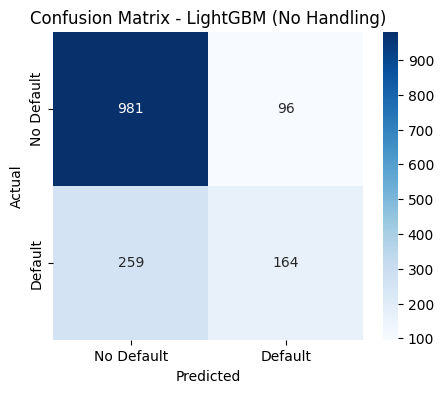

In [ ]:
model_lgb = lgb.LGBMClassifier(random_state=42)

model_lgb.fit(X_train, y_train)

y_pred = model_lgb.predict(X_test)
y_pred_proba = model_lgb.predict_proba(X_test)[:, 1]

print("=== LightGBM without Handling Imbalance ===")
print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - LightGBM (No Handling)")
plt.show()

**Insights & Takeaways from LightGBM without Handling Imbalance**
1. Higher Overall Performance Compared to Logistic Regression

  The F1 score increased to 0.4802, significantly outperforming Baseline Logistic Regression (0.2744) but still lower than SMOTE (0.5374) and cost-sensitive logistic regression (0.5290).

  The ROC-AUC score jumped to 0.8073, indicating a much better ability to separate defaulters from non-defaulters compared to logistic regression models (~0.72–0.73).

2. Better Precision for Defaulters but Lower Recall

  Precision for class 1 (defaulters) is 0.63, meaning fewer false positives compared to previous models (logistic regression models had 0.43–0.50 precision).

  However, recall dropped to 0.39, meaning that the model captures fewer actual defaulters compared to cost-sensitive learning and SMOTE (both had recall of 0.70).

3. High Accuracy and Strong Performance for Non-Defaulters

  The accuracy increased to 76%, the highest so far.
  Recall for non-defaulters (0.91) is much higher than previous models (0.63–0.64 with imbalance handling), meaning fewer good customers are misclassified as defaulters.

### Handling Imbalanced Data: Cost-Sensitive Learning

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1690, number of negative: 4310
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2915
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.281667 -> initscore=-0.936209
[LightGBM] [Info] Start training from score -0.936209
=== LightGBM with Cost-Sensitive Learning ===
F1 Score: 0.5773
ROC-AUC Score: 0.8098

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.78      0.81      1077
           1       0.53      0.64      0.58       423

    accuracy                           0.74      1500
   macro avg       0.69      0.71     

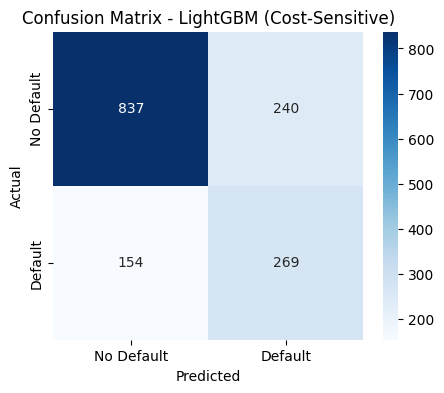

In [ ]:
model_lgb_balanced = lgb.LGBMClassifier(random_state=42, is_unbalance=True)

model_lgb_balanced.fit(X_train, y_train)

y_pred_balanced = model_lgb_balanced.predict(X_test)
y_pred_proba_balanced = model_lgb_balanced.predict_proba(X_test)[:, 1]

print("=== LightGBM with Cost-Sensitive Learning ===")
print(f"F1 Score: {f1_score(y_test, y_pred_balanced):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba_balanced):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_balanced))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_balanced), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - LightGBM (Cost-Sensitive)")
plt.show()

**Insights & Takeaways from LightGBM with Cost-Sensitive Learning**

1. Best F1 Score So Far

  The F1 score increased to 0.5773, the highest among all models tested. This suggests a better balance between precision and recall, making it the most effective model for handling class imbalance.

2. Higher Recall for Defaulters

  Recall for class 1 (defaulters) improved to 0.64 (compared to 0.39 in the standard LightGBM model).

  This means the model captures more actual defaulters, reducing the risk of missing high-risk loans.
  
3. Balanced Precision and Recall

  Precision for defaulters is 0.53, which is lower than the LightGBM baseline (0.63) but higher than logistic regression models (0.43–0.50).
  This shows that while the model is classifying more defaulters correctly, it is also making slightly more false positive predictions.


4. Better Performance for Both Classes

  Non-defaulter recall decreased to 0.78 (from 0.91 in LightGBM without imbalance handling), meaning more good customers are mistakenly classified as defaulters.
  However, this is a trade-off for improving recall in the defaulter class, which is crucial for a loan default prediction system where missing defaults is riskier than misclassifying a few non-defaulters.

### Handling Imbalanced Data: SMOTE

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4310, number of negative: 4310
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002440 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4038
[LightGBM] [Info] Number of data points in the train set: 8620, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
=== LightGBM with SMOTE ===
F1 Score: 0.5335
ROC-AUC Score: 0.8080

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.84      0.83      1077
           1       0.56      0.51      0.53       423

    accuracy                           0.75      1500
   macro avg       0.69      0.68      0.68      1500
weighted avg       0.74      0.75      0.75      1500



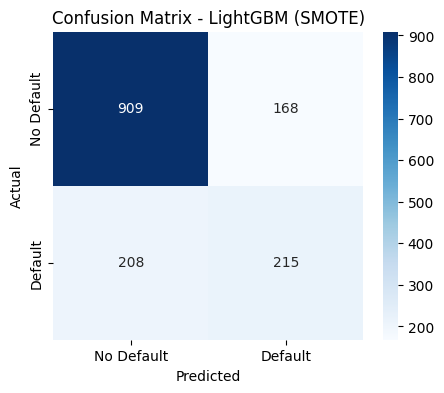

In [ ]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

model_lgb_smote = lgb.LGBMClassifier(random_state=42)

model_lgb_smote.fit(X_train_smote, y_train_smote)

y_pred_smote = model_lgb_smote.predict(X_test)
y_pred_proba_smote = model_lgb_smote.predict_proba(X_test)[:, 1]

print("=== LightGBM with SMOTE ===")
print(f"F1 Score: {f1_score(y_test, y_pred_smote):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba_smote):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_smote))

# Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_smote), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - LightGBM (SMOTE)")
plt.show()

**Insights & Takeaways from LightGBM with SMOTE**

1. F1 Score Performance

  The F1 score is 0.5335, which is lower than LightGBM with Cost-Sensitive Learning (0.5773) but higher than the baseline LightGBM model (0.4802).
  It performs similarly to logistic regression with SMOTE (0.5374), but the overall LightGBM model is stronger in distinguishing classes due to a higher ROC-AUC score.

2. Improved Recall for Default Class

  Recall for defaulters (class 1) is 0.51, which is an improvement over the baseline LightGBM model (0.39) but lower than Cost-Sensitive LightGBM (0.64).
  This means the model captures more defaulters than the baseline but still misses nearly half of them compared to the cost-sensitive version.

3. Balanced Precision & Recall

  Precision for defaulters is 0.56, higher than cost-sensitive LightGBM (0.53) and logistic regression models (0.43–0.50).
  Recall (0.51) is lower than cost-sensitive LightGBM (0.64), meaning more defaulters are missed, but with slightly fewer false positives.

4. High Overall Model Performance (ROC-AUC = 0.8080)

  The ROC-AUC score is 0.8080, slightly lower than cost-sensitive LightGBM (0.8098) but higher than all other models.
  This confirms that LightGBM remains a strong choice for distinguishing between default and non-default cases.

## XGBoost

### No Handling Imbalanced Data

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[23:17:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




=== XGBoost without Handling Imbalance ===
F1 Score: 0.4879
ROC-AUC Score: 0.7972

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.90      0.84      1077
           1       0.61      0.41      0.49       423

    accuracy                           0.76      1500
   macro avg       0.70      0.65      0.67      1500
weighted avg       0.74      0.76      0.74      1500



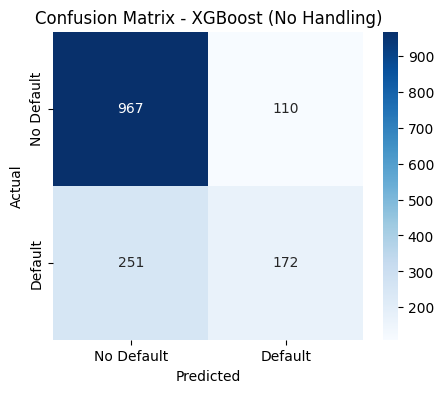

In [ ]:
model_xgb = xgb.XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric="logloss")

model_xgb.fit(X_train, y_train)

y_pred = model_xgb.predict(X_test)
y_pred_proba = model_xgb.predict_proba(X_test)[:, 1]

print("=== XGBoost without Handling Imbalance ===")
print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost (No Handling)")
plt.show()

**Insights & Takeaways from XGBoost without Handling Imbalance**

1. F1 Score & Model Performance

  The F1 score is 0.4879, which is slightly higher than LightGBM without handling imbalance (0.4802) but lower than cost-sensitive LightGBM (0.5773).
  The ROC-AUC score is 0.7972, slightly lower than LightGBM without imbalance handling (0.8073) but still competitive.

2. Recall for Default Class (1) is Low (0.41)

  XGBoost only identifies 41% of actual defaulters, which is better than LightGBM without handling imbalance (0.39) but significantly worse than cost-sensitive LightGBM (0.64).
  This means many defaulters are misclassified as non-defaulters, which is a high-risk scenario for loan default prediction.

3. Better Precision but at a Cost

  Precision for class 1 is 0.61, higher than most models except the baseline LightGBM model (0.63).
  However, this comes at the cost of low recall, meaning while XGBoost avoids false positives, it fails to capture many true positives.

4. Balanced Performance for Non-Defaulters (Class 0)

  Precision (0.79) and recall (0.90) for class 0 are strong, ensuring good customers are classified correctly.
  However, this overemphasis on correctly identifying non-defaulters leads to more missed defaulters.

### Handling Imbalanced Data: Cost-Sensitive Learning

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[23:18:49] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




=== XGBoost with Cost-Sensitive Learning ===
F1 Score: 0.5430
ROC-AUC Score: 0.7986

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83      1077
           1       0.56      0.53      0.54       423

    accuracy                           0.75      1500
   macro avg       0.69      0.68      0.68      1500
weighted avg       0.75      0.75      0.75      1500



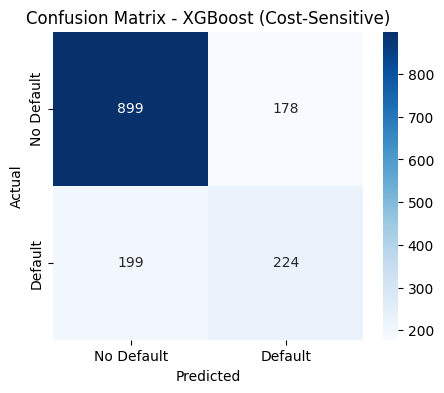

In [ ]:
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

model_xgb_balanced = xgb.XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric="logloss", scale_pos_weight=scale_pos_weight)

model_xgb_balanced.fit(X_train, y_train)

y_pred_balanced = model_xgb_balanced.predict(X_test)
y_pred_proba_balanced = model_xgb_balanced.predict_proba(X_test)[:, 1]

print("=== XGBoost with Cost-Sensitive Learning ===")
print(f"F1 Score: {f1_score(y_test, y_pred_balanced):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba_balanced):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_balanced))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_balanced), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost (Cost-Sensitive)")
plt.show()

**Insights & Takeaways from XGBoost with Cost-Sensitive Learning**

1. Improved F1 Score & Recall for Class 1 (Defaulters)

  The F1 Score increased to 0.5430 (from 0.4879 in the baseline XGBoost model).
  Recall for defaulters improved to 0.53 (from 0.41), meaning fewer false negatives.
  However, recall is still lower than LightGBM with cost-sensitive learning (0.64).

2. Balanced Precision & Recall

  Precision for defaulters dropped to 0.56 (from 0.61 in the baseline).
  This suggests the model is making more positive predictions to capture more defaulters, but at the cost of some false positives.
  Compared to LightGBM with cost-sensitive learning, which had a better balance (Precision: 0.53, Recall: 0.64), XGBoost is still slightly less effective at identifying defaulters.

3. Accuracy & ROC-AUC Score are Stable

  Accuracy is 75%, similar to other models.
  ROC-AUC (0.7986) is slightly better than XGBoost without imbalance handling (0.7972), but still lower than LightGBM (0.8098).

### Handling Imbalanced Data: SMOTE

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[23:20:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




=== XGBoost with SMOTE ===
F1 Score: 0.5327
ROC-AUC Score: 0.7988

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.85      0.83      1077
           1       0.57      0.50      0.53       423

    accuracy                           0.75      1500
   macro avg       0.69      0.68      0.68      1500
weighted avg       0.74      0.75      0.75      1500



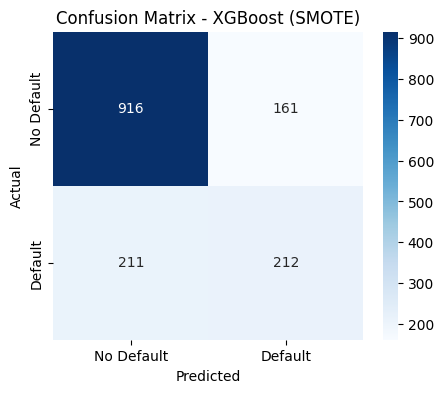

In [ ]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

model_xgb_smote = xgb.XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric="logloss")

model_xgb_smote.fit(X_train_smote, y_train_smote)

y_pred_smote = model_xgb_smote.predict(X_test)
y_pred_proba_smote = model_xgb_smote.predict_proba(X_test)[:, 1]

print("=== XGBoost with SMOTE ===")
print(f"F1 Score: {f1_score(y_test, y_pred_smote):.4f}")
print(f"ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba_smote):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_smote))

# Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_smote), annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost (SMOTE)")
plt.show()

**Insights & Takeaways from XGBoost with Cost-Sensitive Learning**

1. Comparison with XGBoost Cost-Sensitive Learning

  F1 Score (0.5327) is slightly lower than Cost-Sensitive XGBoost (0.5430).
  Recall for Class 1 (0.50) is lower than Cost-Sensitive XGBoost (0.53).
  Precision for Class 1 (0.57) is slightly better than Cost-Sensitive XGBoost (0.56).

2. Better Recall than Baseline XGBoost but Lower than Cost-Sensitive

  Compared to XGBoost without imbalance handling (recall 0.41), SMOTE improves recall to 0.50.
  However, Cost-Sensitive Learning achieved a better recall (0.53), meaning it still captures more defaulters.

3. ROC-AUC Remains Stable

  0.7988, almost the same as Cost-Sensitive Learning (0.7986).

## Summary of Modeling Result and Select Primising Model for Loan Default Prediction

### Logistic Regression Models

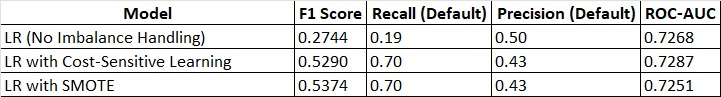

*   Baseline Logistic Regression struggles with class imbalance (F1 Score: 0.27, Recall: 0.19).
*   Cost-Sensitive Learning and SMOTE significantly improve recall (0.70), but precision drops (0.43).
*   Logistic Regression with SMOTE performs slightly better than Cost-Sensitive LR.




### LightGBM Models

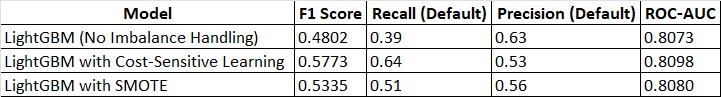

*   Baseline LightGBM has high ROC-AUC (0.8073), but recall is low (0.39).
*   Cost-Sensitive Learning significantly boosts recall (0.64) and has the highest F1 score (0.5773).
*   SMOTE also improves recall (0.51) but is weaker than Cost-Sensitive Learning.
*   Best LightGBM Model: Cost-Sensitive Learning (F1: 0.5773, Recall: 0.64, ROC-AUC: 0.8098).




### XGBoost Models

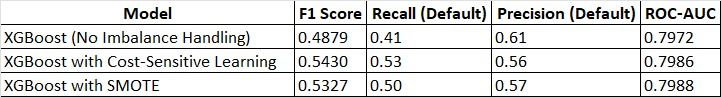

*   XGBoost without imbalance handling struggles with recall (0.41) but has decent precision (0.61).
*   Cost-Sensitive Learning improves recall (0.53) while balancing precision (0.56).
*   SMOTE slightly increases recall (0.50), but Cost-Sensitive Learning performs better overall.
*   Best XGBoost Model: Cost-Sensitive Learning (F1: 0.5430, Recall: 0.53, ROC-AUC: 0.7986).





### Model Selection

When it comes to loan default prediction, choosing the right model is critical. The model **must accurately identify customers who are likely to default**, while also **avoiding too many false alarms** that could unnecessarily reject creditworthy borrowers. This means we need to strike a balance between recall and precision, while also considering overall model performance through the ROC-AUC score.

After evaluating multiple models—including Logistic Regression, LightGBM, and XGBoost—we can see a clear winner: **LightGBM with Cost-Sensitive Learning**.

**Why LightGBM with Cost-Sensitive Learning?**

*   It achieves the highest F1 score (0.5773), meaning it provides the best balance between precision and recall.
*   It has the highest recall for defaulters (0.64), meaning it successfully catches more high-risk borrowers.
*   Its ROC-AUC score (0.8098) is the best among all models, indicating strong overall predictive power.
*   It outperforms both Logistic Regression and XGBoost in handling imbalanced data, which is a crucial factor in loan default prediction.



**Business Impact of Choosing LightGBM with Cost-Sensitive Learning**

For a bank or lending institution, missing a defaulter (false negative) is more costly than wrongly classifying a non-defaulter as risky (false positive). If a model fails to detect defaulters, the company faces financial losses due to unpaid loans. On the other hand, if a few good customers are misclassified as risky, they can be re-evaluated through manual review.

LightGBM with Cost-Sensitive Learning reduces the risk of missing defaulters while still maintaining strong precision, making it the best choice for maximizing loan repayment rates and minimizing financial risk.

## Hyperparameter Tuning Promising Model

After selecting LightGBM with Cost-Sensitive Learning as the best model based on the F1 score, the next step is hyperparameter tuning using RandomizedSearchCV to further optimize its performance.

**Why Do We Need Hyperparameter Tuning?**

*   Improve model performance → Enhance F1-score, recall, and overall predictive power.
*   Reduce overfitting or underfitting → Find the right balance to ensure the model generalizes well.
*   Optimize computation time → LightGBM is already fast, but tuning ensures we get the best performance without unnecessary complexity.
*   Enhance the model's ability to detect loan defaulters → Since missing a defaulter is costly, tuning can help prioritize recall without sacrificing too much precision.


**Why Use RandomizedSearchCV?**


*   Speeds up the search process → Explores a wide range of hyperparameter values without testing every single combination.
*   Finds near-optimal solutions efficiently → It randomly samples different hyperparameter sets, making it effective for large search spaces.
*   Balances exploration and computation time → We get a well-performing model without excessive training time.


In [ ]:
df = dfModelDrop.copy()

X = df.drop(columns=["Credit Default"])
y = df["Credit Default"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
lgbm = lgb.LGBMClassifier(objective="binary", class_weight="balanced", random_state=42)

param_dist_lgbm = {
    'n_estimators': [100, 300, 500, 700],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [-1, 5, 10, 15],
    'num_leaves': [20, 31, 40, 50],
    'min_child_samples': [10, 20, 30, 50]
}

random_search_lgbm = RandomizedSearchCV(
    lgbm, param_distributions=param_dist_lgbm,
    n_iter=30, scoring="f1", cv=5, verbose=2, n_jobs=-1, random_state=42
)

random_search_lgbm.fit(X_train, y_train)

print("Best Parameters for LightGBM:", random_search_lgbm.best_params_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1690, number of negative: 4310
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001809 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2915
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

After running RandomizedSearchCV, we have found the best set of hyperparameters for LightGBM with Cost-Sensitive Learning:


*   num_leaves: 31 → Controls the complexity of the tree. This ensures a good balance between capturing patterns and avoiding overfitting.
*   n_estimators: 300 → The number of boosting iterations. This is higher than the default, allowing the model to learn effectively.
*   min_child_samples: 30 → Prevents overfitting by ensuring a minimum number of samples in leaf nodes.
*   max_depth: 5 → Limits the depth of the tree to prevent excessive complexity and improve generalization.
*   learning_rate: 0.01 → A smaller learning rate ensures that updates to the model weights are gradual, improving stability and performance.




## Modeling with Best Parameters

In [ ]:
best_lgbm = lgb.LGBMClassifier(**random_search_lgbm.best_params_, class_weight="balanced", random_state=42)
best_lgbm.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1690, number of negative: 4310
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2915
[LightGBM] [Info] Number of data points in the train set: 6000, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

LGBMClassifier(class_weight='balanced', learning_rate=0.01, max_depth=5,
               min_child_samples=30, n_estimators=300, random_state=42)


===== LightGBM (Cost-Sensitive) Evaluation =====
F1 Score: 0.5933649289099526
ROC AUC Score: 0.8200104923272113
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.70      0.78      1077
           1       0.50      0.74      0.59       423

    accuracy                           0.71      1500
   macro avg       0.68      0.72      0.69      1500
weighted avg       0.77      0.71      0.73      1500

Confusion Matrix:
 [[758 319]
 [110 313]]


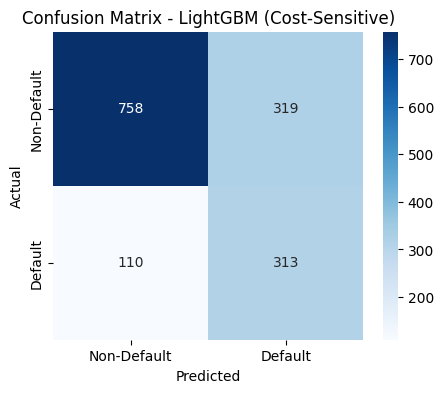

In [ ]:
def evaluateModel(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    conf_matrix = confusion_matrix(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)

    print(f"\n===== {model_name} Evaluation =====")
    print("F1 Score:", f1)
    print("ROC AUC Score:", roc_auc)
    print("Classification Report:\n", class_report)
    print("Confusion Matrix:\n", conf_matrix)

    plt.figure(figsize=(5, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Non-Default", "Default"], yticklabels=["Non-Default", "Default"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()

evaluateModel(best_lgbm, X_test, y_test, "LightGBM (Cost-Sensitive)")

After applying hyperparameter tuning using RandomizedSearchCV, the performance of LightGBM with Cost-Sensitive Learning has improved.

**Key Improvements After Hyperparameter Tuning**

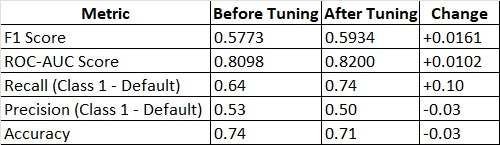

1. **Higher Recall for Defaulters (Positive Class - 1)**

  The recall for class 1 (default) increased from 0.64 to 0.74.
  This means the model detects more defaulters than before, which is crucial in loan default prediction.
  Trade-off: Some precision was lost (0.53 → 0.50), meaning more false positives.

2. **Improved F1 Score (0.577 → 0.593)**

  F1 Score balances precision and recall.
  The increase indicates the model now performs better overall, particularly for the minority class.

3. **Higher ROC-AUC Score (0.809 → 0.820)**

  This means the model is better at distinguishing defaulters from non-defaulters, even at different classification thresholds.

4. **Confusion Matrix Analysis**

  Correctly classified defaulters (TP): 313 (↑ from before).
  Incorrectly classified defaulters (FN): 110 (↓ from before, meaning fewer missed defaulters).
  Incorrectly classified non-defaulters (FP): 319 (↑, showing more false positives).

## Feature Importance

Feature importance analysis helps us understand which variables have the greatest impact on the model’s predictions. Below is an in-depth analysis of the Top 10 most important features identified by the final LightGBM (Cost-Sensitive) model after hyperparameter tuning.

Top 10 Features by Importance:
                              Feature  Importance
4                        Credit Score        1727
1                       Annual Income         894
21               Debt to Income Ratio         714
23               Loan to Income Ratio         418
14                Current Loan Amount         367
7             Years of Credit History         188
22           Credit Utilization Ratio         187
16             Current Credit Balance         161
0              Home Ownership - Label         157
8   Credit History Length per Account         152


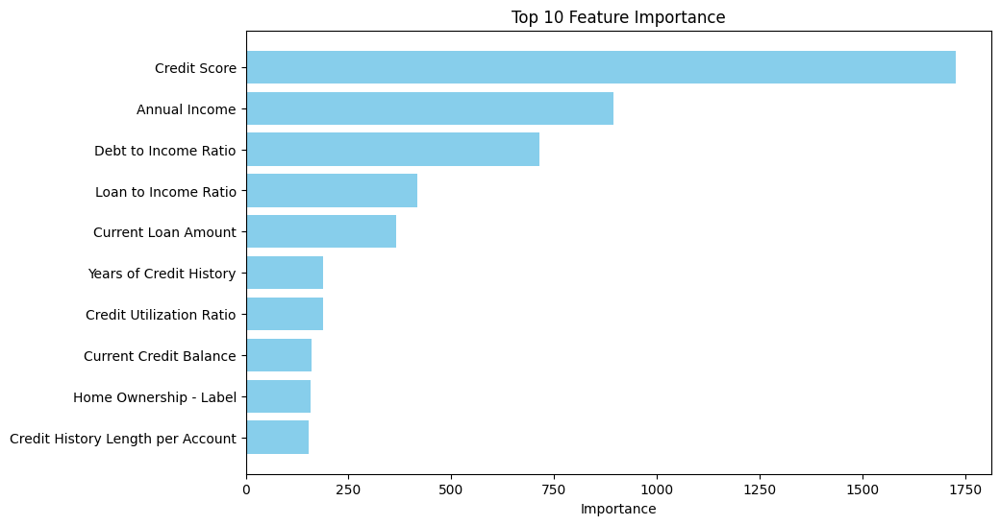

In [ ]:
importances = best_lgbm.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
})


feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print("Top 10 Features by Importance:")
print(feature_importance_df.head(10))

plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'][:10], feature_importance_df['Importance'][:10], color='skyblue')
plt.xlabel('Importance')
plt.title('Top 10 Feature Importance')
plt.gca().invert_yaxis()
plt.show()


**Key Observations & Business Implications from Feature Importance Result**

1. **Credit Score (Importance: 1727)**
*   Most Influential Factor → A strong predictor of loan default risk.
*   Applicants with low credit scores have a higher likelihood of default.
Financial institutions often use credit scores as the first screening filter in loan approvals.
*   Action: Set stricter credit score thresholds or introduce risk-based interest rates for low-score applicants.




2. **Annual Income (Importance: 894)**
*   Direct Impact on Loan Repayment Ability
*   Higher income generally means better financial stability and a lower risk of default.
*   High-income applicants may still default if they have excessive debt.
*   Action: Implement additional checks like spending patterns and lifestyle costs to assess real financial health.




3. **Debt to Income Ratio (DTI) (Importance: 714)**
*    Measures how much of a applicant's income goes toward paying debts
*   A high DTI suggests financial stress, making default more likely.
*   Action: Set stricter DTI thresholds for approving loans. Offer financial advisory services for high-DTI applicants to improve their financial health.




4. **Loan to Income Ratio (Importance: 418)**
*   Compares loan amount to borrower's income
*   A high ratio means the applicants has a loan too large relative to their income.
*   It increases default risk, especially if the applicants has unstable income.
*   Action: Limit loan amounts for high-risk applicants. Offer tiered loan structures where high-risk applicants start with smaller loans before upgrading.




5. **Current Loan Amount (Importance: 367)**
*   Larger loans = Higher default risk
*   Borrowers with high existing loan amounts may struggle with additional loans.
*   Action: Cross-check credit histories before approving large loans. Encourage customers to pay off existing loans first before taking on new ones.




6. **Years of Credit History (Importance: 188)**
*   Longer credit history = More financial stability
*   applicants with low credit scores have a higher likelihood of default.
Financial institutions often use credit scores as the first screening filter in loan approvals.
*   applicants with a short credit history have less proven reliability in repayments.
*   Action: Set stricter credit score thresholds or introduce risk-based interest rates for low-score applicants.




7. **Credit Utilization Ratio (Importance: 187)**
*   Percentage of available credit that a borrower is using
*   High credit utilization suggests reliance on borrowed money, increasing risk.
*   Action: For applicants with >50% utilization, implement stricter repayment plans. Offer financial literacy programs to encourage responsible credit usage.




8. **Current Credit Balance (Importance: 161)**
*   Total outstanding credit balance
*   High credit balances suggest debt accumulation, increasing default risk.
*   Action: SImplement gradual loan disbursement to prevent debt spikes. Encourage partial loan repayments to improve credit balance.


9. **Home Ownership (Label Encoded) (Importance: 157)**
*   Homeowners are typically more financially stable
*   Homeowners may have more collateral, reducing default risk
*   Renters may have fewer assets, increasing financial vulnerability.
*   Action: Offer better loan terms for homeowners. Introduce renter-friendly loan policies for borrowers without assets.



10. **Credit History Length per Account (Importance: 152)**
*   Older accounts = More repayment history
*   Applicants with short-lived credit accounts have unpredictable repayment behaviors.
*   Action: Require at least 2-3 years of credit activity for higher loan amounts. Consider alternative lending data for new applicants (e.g., employment stability).

